In [1]:

from __future__ import absolute_import
from __future__ import division
from __future__ import print_function
import tensorflow as tf

from datetime import datetime
import json
import os
import shutil
from timeit import default_timer as timer

# import tensorflow as tf

import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import img_to_array, load_img
#from sklearn.model_selection import train_test_split

from util import mnist_binary_data_and_preprocessing, custom_sign_metric_for_training,mnist_data_and_preprocessing, mnist_binary_all_data_and_preprocessing
from delta_experiments_algorithms import find_max_delta,compute_bounds,test_iterations_influence,compare2models_trained,compute_delta_test_set
from adversarial_training import training_model,pgd_adversarial_training,fgsm_adversarial_training

from adversarial_training import training_model,pgd_adversarial_training,fgsm_adversarial_training
from training_model import ground_model_delta_experiments1,ground_model_delta_experiments2,ground_model_delta_experiments3,ground_model_delta_experiments4

In [2]:


from datetime import datetime
import json
import os
import shutil


from timeit import default_timer as timer

import tensorflow as tf

import numpy as np
import matplotlib.pyplot as plt
from util import mnist_data_and_preprocessing
from adversarial_training import pgd_adversarial_training,fgsm_adversarial_training,training_model,ground_model,pgdl2_adversarial_training


In [3]:
x_train, y_train, x_test, y_test=mnist_data_and_preprocessing()
input_shape = (28, 28, 1)

# model = ground_model(input_shape)

learning_rate =0.0001

# optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)
loss_object = tf.keras.losses.CategoricalCrossentropy()
epochs = 20
batch_size = 32

step_size_attack=2.5*0.3/10
 
pgd=pgd_adversarial_training(ground_model(input_shape),tf.keras.optimizers.Adam(learning_rate=learning_rate), loss_object,epochs,batch_size,x_train[:1000], y_train[:1000], x_test[:100], y_test[:100], epsilon_attack_train=0.3, iterations_attack_train=10, step_size_attack_train=step_size_attack, batch=True)
    
fgsm=fgsm_adversarial_training(ground_model(input_shape), tf.keras.optimizers.Adam(learning_rate=learning_rate), loss_object,epochs,batch_size,x_train[:10000], y_train[:10000], x_test[:1000], y_test[:1000], epsilon_attack_train=0.3)

pgdl2=pgdl2_adversarial_training(ground_model(input_shape),tf.keras.optimizers.Adam(learning_rate=learning_rate), loss_object,epochs,batch_size,x_train[:1000], y_train[:1000], x_test[:1000], y_test[:1000], epsilon_attack_train=1, iterations_attack_train=20, step_size_attack_train=0.1)

normal=training_model(ground_model(input_shape), tf.keras.optimizers.Adam(learning_rate=learning_rate), loss_object,epochs,batch_size,x_train[:1000], y_train[:1000], x_test[:100], y_test[:100])




C:\Users\samue\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [7]:
import numpy as np
import tensorflow as tf

# Load MNIST data
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()

# Reshape and normalize
x_train = x_train.reshape(-1, 28, 28, 1).astype("float32") / 255.0
x_test = x_test.reshape(-1, 28, 28, 1).astype("float32") / 255.0

input_shape = (28, 28, 1)


def group_by_label(x, y):
    """Groups data by label."""
    grouped_data = {}
    for i in range(10):  # Since MNIST has 10 classes (0-9)
        mask = y == i
        grouped_data[i] = (x[mask], y[mask])
    return grouped_data

# Group train and test data by labels
grouped_train_data = group_by_label(x_train, y_train)
grouped_test_data = group_by_label(x_test, y_test)


def batch_generator(grouped_data, batch_size=32):
    """Generator that yields batches with the same label."""
    while True:  # Infinite loop for training
        for label, (x, y) in grouped_data.items():
            num_samples = x.shape[0]
            indices = np.arange(num_samples)
            np.random.shuffle(indices)  # Shuffle indices for each label
            for start_idx in range(0, num_samples, batch_size):
                end_idx = min(start_idx + batch_size, num_samples)
                batch_indices = indices[start_idx:end_idx]
                yield x[batch_indices], y[batch_indices]

# Create train and test generators
train_gen = batch_generator(grouped_train_data, batch_size=32)
test_gen = batch_generator(grouped_test_data, batch_size=32)

In [12]:
fgsm.train()



Epoch 1/10


KeyboardInterrupt: 

In [4]:
pgd.train()

Epoch 1/10
shapeeeeeeeeeeeeeeeeeeeeee x_adv (32, 28, 28)
shapeeeeeeeeeeeeeeeeeeeeee x_adv (32, 28, 28)
shapeeeeeeeeeeeeeeeeeeeeee x_adv (32, 28, 28)
shapeeeeeeeeeeeeeeeeeeeeee x_adv (32, 28, 28)
shapeeeeeeeeeeeeeeeeeeeeee x_adv (32, 28, 28)
shapeeeeeeeeeeeeeeeeeeeeee x_adv (32, 28, 28)
shapeeeeeeeeeeeeeeeeeeeeee x_adv (32, 28, 28)
shapeeeeeeeeeeeeeeeeeeeeee x_adv (32, 28, 28)
shapeeeeeeeeeeeeeeeeeeeeee x_adv (32, 28, 28)
shapeeeeeeeeeeeeeeeeeeeeee x_adv (32, 28, 28)
shapeeeeeeeeeeeeeeeeeeeeee x_adv (32, 28, 28)
shapeeeeeeeeeeeeeeeeeeeeee x_adv (32, 28, 28)
shapeeeeeeeeeeeeeeeeeeeeee x_adv (32, 28, 28)
shapeeeeeeeeeeeeeeeeeeeeee x_adv (32, 28, 28)
shapeeeeeeeeeeeeeeeeeeeeee x_adv (32, 28, 28)
shapeeeeeeeeeeeeeeeeeeeeee x_adv (32, 28, 28)
shapeeeeeeeeeeeeeeeeeeeeee x_adv (32, 28, 28)
shapeeeeeeeeeeeeeeeeeeeeee x_adv (32, 28, 28)
shapeeeeeeeeeeeeeeeeeeeeee x_adv (32, 28, 28)
shapeeeeeeeeeeeeeeeeeeeeee x_adv (32, 28, 28)
shapeeeeeeeeeeeeeeeeeeeeee x_adv (32, 28, 28)
shapeeeeeeeeeeeeeeeeeee

In [5]:
normal.train()

Epoch 1/10
Loss: 67.28450775146484
Epoch 2/10
Loss: 45.33006286621094
Epoch 3/10
Loss: 24.600202560424805
Epoch 4/10
Loss: 15.782114028930664
Epoch 5/10
Loss: 12.684615135192871
Epoch 6/10
Loss: 10.830286026000977
Epoch 7/10
Loss: 9.402305603027344
Epoch 8/10
Loss: 8.139347076416016
Epoch 9/10
Loss: 7.088692665100098
Epoch 10/10
Loss: 6.823859691619873


In [6]:
normal.attack_pgd(0.3,10,2.5*0.3/10)

Accuracy on adversarial test set: 0.01
Accuracy on test set: 0.93


(<Sequential name=sequential_3, built=True>, 0.01, 0.93)

In [6]:
pgd.attack_pgd(0.3,10,2.5*0.3/10)

shapeeeeeeeeeeeeeeeeeeeeee x_adv (100, 28, 28)
Accuracy on adversarial test set: 0.28
Accuracy on test set: 0.66


(<Sequential name=sequential, built=True>, 0.28, 0.66)

In [5]:
normal.x_test=x_test[:100]
normal.y_test=y_test[:100]

In [6]:
normal.attack_fgsm(0.3)

Accuracy on adversarial test set: 0.01
Accuracy on test set: 0.97


(<Sequential name=sequential_3, built=True>, 0.01, 0.97)

In [16]:
y_test.shape

(10000,)

In [35]:
from attacks import FGSMAttack,PGDAttack,PGDAttackl2
from adversarial_training import print_accuracy
x_train, y_train, x_test, y_test=mnist_data_and_preprocessing()
fgsma=FGSMAttack(normal.model,0.3,tf.keras.losses.CategoricalCrossentropy())
pgdat=PGDAttack(normal.model,0.3,tf.keras.losses.CategoricalCrossentropy(),None,10,2.5*0.3/10)
pgdl2=PGDAttackl2(normal.model,3,tf.keras.losses.CategoricalCrossentropy(),10,2.5*3/10)
# x_test_reshaped= np.expand_dims(x_test[0], axis=0)
# y_test_reshaped= np.expand_dims(y_test[0], axis=0)

x_test_reshaped=x_test[:10]
y_test_reshaped=y_test[:10]
xper=pgdat.perturb(x_test_reshaped,y_test_reshaped)






In [21]:
x_test[:10].shape

(10, 28, 28, 1)

In [28]:
xper.shape

TensorShape([10, 28, 28])

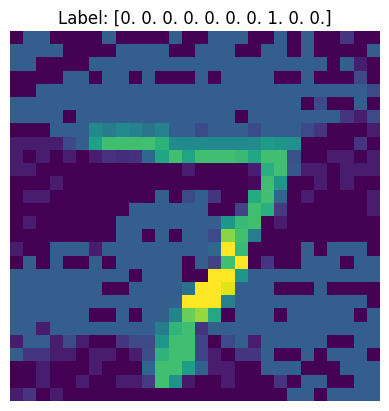

7 [2]


In [37]:
k=0
plt.imshow(xper[k])
plt.title(f'Label: {y_test[k]}')
plt.axis('off')
plt.show()
x_k= np.expand_dims(xper[k], axis=0)
predictions = normal.model(x_k)
predictions=np.argmax(predictions, axis=1)
y_image=np.argmax(y_test[k], axis=0)
print(y_image,predictions)

In [5]:


x_train, y_train, x_test, y_test=mnist_binary_all_data_and_preprocessing()


# use learning rate 0.001 for pgd!!!

input_shape = (28, 28, 1)

learning_rate =0.001



epochs = 20
batch_size = 32 


loss_object = tf.keras.losses.MeanSquaredError()
# loss_object=tf.keras.losses.MeanAbsoluteError()
# always need to initialize a new model/optimizer for each training
normal=training_model(ground_model_delta_experiments1(input_shape),tf.keras.optimizers.Adam(learning_rate=learning_rate),loss_object,epochs,batch_size,x_train, y_train, x_test, y_test)
fgsm=fgsm_adversarial_training(ground_model_delta_experiments1(input_shape),tf.keras.optimizers.Adam(learning_rate=learning_rate), loss_object,epochs,batch_size,x_train, y_train, x_test, y_test, epsilon_attack_train=0.3)
pgd=pgd_adversarial_training(ground_model_delta_experiments1(input_shape),tf.keras.optimizers.Adam(learning_rate=learning_rate), loss_object,epochs,batch_size,x_train, y_train, x_test, y_test, epsilon_attack_train=0.3, iterations_attack_train=40, step_size_attack_train=0.01)


C:\Users\samue\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [6]:
normal1=training_model(ground_model_delta_experiments1(input_shape),tf.keras.optimizers.Adam(learning_rate=learning_rate),loss_object,30,batch_size,x_train[:1000], y_train[:1000], x_test[:1000], y_test[:1000])
normal2=training_model(ground_model_delta_experiments2(input_shape),tf.keras.optimizers.Adam(learning_rate=learning_rate),loss_object,30,batch_size,x_train[:1000], y_train[:1000], x_test[:1000], y_test[:1000])
normal3=training_model(ground_model_delta_experiments3(input_shape),tf.keras.optimizers.Adam(learning_rate=learning_rate),loss_object,30,batch_size,x_train[:1000], y_train[:1000], x_test[:1000], y_test[:1000])
normal4=training_model(ground_model_delta_experiments4(input_shape),tf.keras.optimizers.Adam(learning_rate=learning_rate),loss_object,30,batch_size,x_train[:1000], y_train[:1000], x_test[:1000], y_test[:1000])

In [24]:
normal1.train()
normal2.train()
normal3.train()
normal4.train()

Epoch 1/30
Loss: 8.780762672424316
Epoch 2/30
Loss: 8.222468376159668
Epoch 3/30
Loss: 8.107665061950684
Epoch 4/30
Loss: 8.064693450927734
Epoch 5/30
Loss: 7.992757320404053
Epoch 6/30
Loss: 7.728573322296143
Epoch 7/30
Loss: 7.567165374755859
Epoch 8/30
Loss: 7.456969261169434
Epoch 9/30
Loss: 7.478005409240723
Epoch 10/30
Loss: 7.0014567375183105
Epoch 11/30
Loss: 6.9727888107299805
Epoch 12/30
Loss: 6.935755252838135
Epoch 13/30
Loss: 6.632124900817871
Epoch 14/30
Loss: 6.48676061630249
Epoch 15/30
Loss: 6.39673376083374
Epoch 16/30
Loss: 6.225387096405029
Epoch 17/30
Loss: 6.025397300720215
Epoch 18/30
Loss: 6.2461934089660645
Epoch 19/30
Loss: 5.742197036743164
Epoch 20/30
Loss: 5.685634613037109
Epoch 21/30
Loss: 5.443192481994629
Epoch 22/30
Loss: 5.318732261657715
Epoch 23/30
Loss: 5.143219470977783
Epoch 24/30
Loss: 5.1550445556640625
Epoch 25/30
Loss: 4.946073532104492
Epoch 26/30
Loss: 4.932755947113037
Epoch 27/30
Loss: 4.631129264831543
Epoch 28/30
Loss: 4.527586460113525

In [5]:
normal1.evaluate_model_test_set(robustness_experiment=True)
normal2.evaluate_model_test_set(robustness_experiment=True)
normal3.evaluate_model_test_set(robustness_experiment=True)
normal4.evaluate_model_test_set(robustness_experiment=True)



32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step   
Accuracy on test set: 0.822
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Accuracy on test set: 0.456
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Accuracy on test set: 0.456
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Accuracy on test set: 0.456


0.456

In [29]:
def custom_sign(x):
        return tf.sign(x)

def model_with_sign(model):
    model_with_sign = tf.keras.models.Sequential([
        model,                       
        tf.keras.layers.Lambda(custom_sign)          
    ])
    return model_with_sign


x_tests = x_test[:1000]
y_tests = y_test[:1000]

preds1 = model_with_sign(normal1.model).predict(x_tests).flatten()
preds2 = model_with_sign(normal2.model).predict(x_tests).flatten()
preds3 = model_with_sign(normal3.model).predict(x_tests).flatten()
preds4 = model_with_sign(normal4.model).predict(x_tests).flatten()

# Step 2: Find images correctly classified by all three models
correct_mask = (preds1 == y_tests) #& (preds2 == y_tests) & (preds3 == y_tests) & (preds4 == y_tests)

# Get the correctly classified images
correct_images = x_tests[correct_mask]
correct_labels = y_tests[correct_mask]

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


In [39]:
normal1.train()

Epoch 1/30
Loss: 4.241894245147705
Epoch 2/30
Loss: 3.9727933406829834
Epoch 3/30
Loss: 4.029902935028076
Epoch 4/30
Loss: 3.8555068969726562
Epoch 5/30
Loss: 3.6704916954040527
Epoch 6/30
Loss: 3.680051803588867
Epoch 7/30
Loss: 3.7197582721710205
Epoch 8/30
Loss: 3.4216489791870117
Epoch 9/30
Loss: 3.5316920280456543
Epoch 10/30
Loss: 3.234919786453247
Epoch 11/30
Loss: 3.165966033935547
Epoch 12/30
Loss: 3.070733070373535
Epoch 13/30
Loss: 3.1297006607055664
Epoch 14/30
Loss: 3.0239932537078857
Epoch 15/30
Loss: 2.886352062225342
Epoch 16/30
Loss: 2.825468063354492
Epoch 17/30
Loss: 2.7183446884155273
Epoch 18/30
Loss: 2.6575872898101807
Epoch 19/30
Loss: 2.6082406044006348
Epoch 20/30
Loss: 2.4928126335144043
Epoch 21/30
Loss: 2.455885410308838
Epoch 22/30
Loss: 2.477886199951172
Epoch 23/30
Loss: 2.4592902660369873
Epoch 24/30
Loss: 2.2779762744903564
Epoch 25/30
Loss: 2.2591636180877686
Epoch 26/30
Loss: 2.3161725997924805
Epoch 27/30
Loss: 2.166417360305786
Epoch 28/30
Loss: 2.1

In [11]:
correct_images[:1].shape

(1, 28, 28)

In [52]:
import platform
cpuinfo=platform.processor()
print(cpuinfo)

Intel64 Family 6 Model 94 Stepping 3, GenuineIntel


In [49]:
import time
start_time = time.time()
delta_array_normal1,_,_,_,_=compute_delta_test_set(normal4.model, correct_images[:1],0.1,50)
end_time = time.time()
# delta_array_normal2,_,_,_,_=compute_delta_test_set(normal2.model, correct_images,0.1,50)
# delta_array_normal3,_,_,_,_=compute_delta_test_set(normal3.model, correct_images,0.1,50)
# delta_array_normal4,_,_,_,_=compute_delta_test_set(normal4.model, correct_images,0.1,50)
elapsed_time = end_time - start_time

print(f"Elapsed time: {elapsed_time} seconds")

Elapsed time: 0.8786492347717285 seconds


In [23]:
elapsed_time*1000

530.5807590484619

In [12]:
mean1=np.mean(delta_array_normal1)
mean2=np.mean(delta_array_normal2)
mean3=np.mean(delta_array_normal3)
mean4=np.mean(delta_array_normal4)
print(mean1,mean2,mean3,mean4)

0.009566664873185447 0.005181462995970633 0.0005889532730485715 0.00037800098702115613


In [ ]:
mean1=np.mean(delta_array_normal1)
mean2=np.mean(delta_array_normal2)
mean3=np.mean(delta_array_normal3)
mean4=np.mean(delta_array_normal4)
print(mean1,mean2,mean3,mean4)

0.008380698816351098 0.004490800091059231 0.0007909550920633118 0.0004531308116734259


In [25]:
max1=np.median(delta_array_normal1)
max2=np.median(delta_array_normal2)
max3=np.median(delta_array_normal3)
max4=np.median(delta_array_normal4)
print(max1,max2,max3,max4)

0.01054055162387777 0.0042828718591418685 0.0005826711728923881 0.00021743657342239366


C:\Users\Gemeinschafts-PC\AppData\Local\Temp\ipykernel_13140\2573173888.py:4: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data, labels=['Model 1', 'Model 2'])


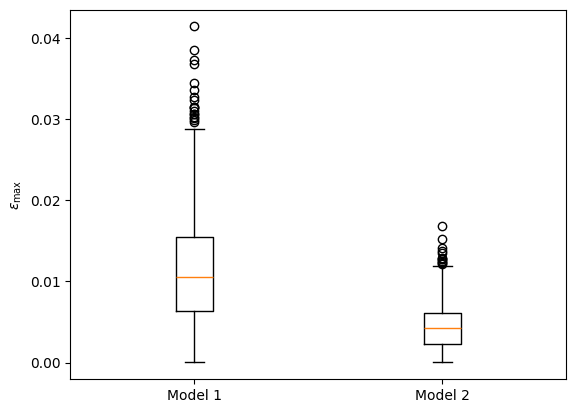

C:\Users\Gemeinschafts-PC\AppData\Local\Temp\ipykernel_13140\2573173888.py:9: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data, labels=['Model 3', 'Model 4'])


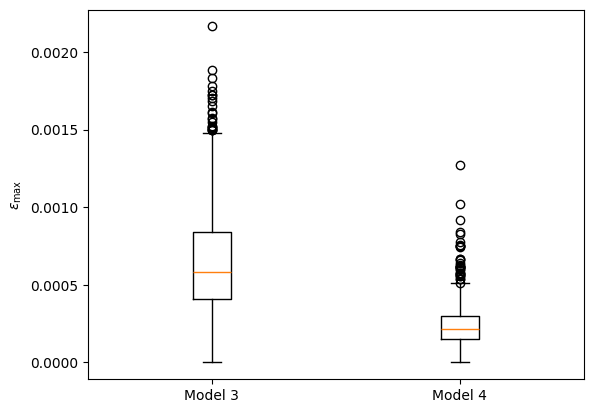

In [13]:
data = [delta_array_normal1, delta_array_normal2]

# Create the boxplot
plt.boxplot(data, labels=['Model 1', 'Model 2'])
plt.ylabel(r'$\epsilon_{\text{max}}$')
plt.show()

data = [delta_array_normal3, delta_array_normal4]
plt.boxplot(data, labels=['Model 3', 'Model 4'])
plt.ylabel(r'$\epsilon_{\text{max}}$')
plt.show()

In [12]:
normal1.evaluate_model_test_set(robustness_experiment=True)
normal2.evaluate_model_test_set(robustness_experiment=True)
normal3.evaluate_model_test_set(robustness_experiment=True)
normal4.evaluate_model_test_set(robustness_experiment=True)


32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Accuracy on test set: 0.807
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Accuracy on test set: 0.817
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Accuracy on test set: 0.772
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Accuracy on test set: 0.818


0.818

In [35]:
import pandas as pd
df = pd.DataFrame(delta_array_normal3, columns=['Values'])

# Save the DataFrame to an Excel file
df.to_excel('delta_array_normal3.xlsx', index=False)

C:\Users\Gemeinschafts-PC\AppData\Local\Temp\ipykernel_6876\3121866731.py:4: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data, labels=['10', '20', '30'])


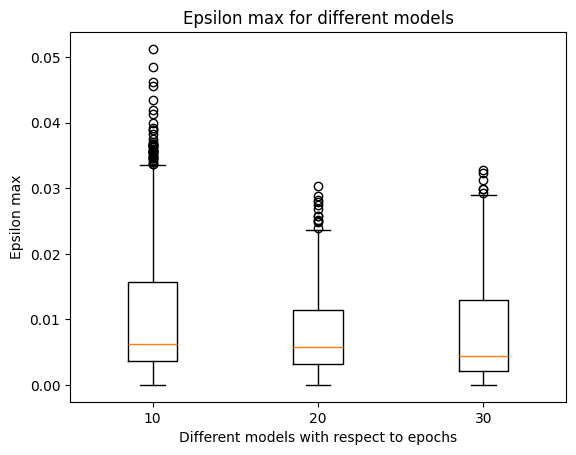

In [16]:
data = [delta_array_normal1, delta_array_normal2, delta_array_normal3]

# Create the boxplot
plt.boxplot(data, labels=['model 1', 'model 2', 'model 3'])
plt.title('Epsilon max for different models')
plt.xlabel('Different models with respect to epochs')
plt.ylabel('Epsilon max')
plt.show()

In [39]:
count = len([x for x in delta_array_normal1 if x > 0.001])
print(count)
print(count/len(delta_array_normal1))

780
0.9811320754716981


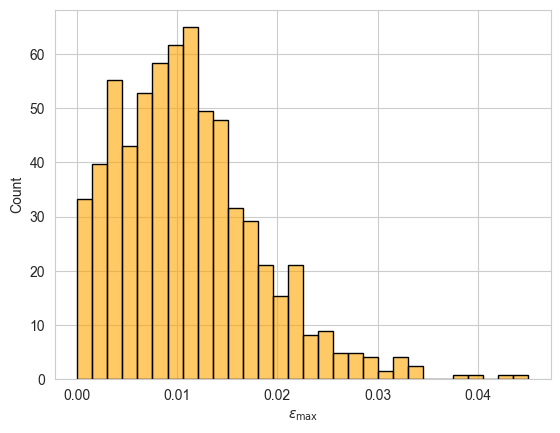

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
# Sample data: Replace this with your epsilon bounds array

sns.set_style("whitegrid")
# Create a density plot
#sns.kdeplot(delta_array_normal1,fill=True,clip=(0,None),  color='orange', alpha=0.6,linewidth=1.5)
sns.histplot(delta_array_normal1, bins=30, color='orange', alpha=0.6, stat='density', edgecolor='black')
# sns.boxplot(y=delta_array_normal1, color='orange', width=0.5, boxprops=dict(alpha=0.6))

# sns.kdeplot(delta_array_normal2, clip=(0,None),color='red', alpha=0.6)
# sns.kdeplot(delta_array_normal3, clip=(0,None), color='green', alpha=0.6)
# sns.kdeplot(delta_array_normal4, clip=(0,None), color='yellow', alpha=0.6)



plt.xlabel(r'$\epsilon_{\text{max}}$')
plt.ylabel('Count')
plt.show()



In [34]:
from adversarial_training import PGDAttack
def test_bounds_attack(model,delta_array,gamma,iterations_attack,x_test,y_test):
    k=0
    array_with_wrong_x=[]
    array_with_wrong_y=[]
    array_with_wrong_epsilons=[]
    for x,y,i in zip(x_test,y_test,delta_array):
        epsilon=i+gamma
        step_size_attack=epsilon/iterations_attack
        

        x= tf.expand_dims(x, axis=0)
        y= tf.expand_dims(y, axis=0)#add batch dimension
        
        pgd=PGDAttack(model, epsilon=epsilon, loss_func=tf.keras.losses.MeanSquaredError(),iterations_attack=iterations_attack,step_size_attack=step_size_attack)
        adv_image = pgd.perturb(x,y)

        prediction=model_with_sign(model).predict(x).flatten()
        prediction_adv = model_with_sign(model).predict(adv_image).flatten()
        if prediction==y and prediction_adv!=y:
            k+=1
            array_with_wrong_x.append(x)
            array_with_wrong_y.append(y)
            array_with_wrong_epsilons.append(i)

    return k,array_with_wrong_x,array_with_wrong_y,array_with_wrong_epsilons 
   

In [18]:
w,array_with_wrong_x,array_with_wrong_y,array_with_wrong_epsilons=test_bounds_attack(normal1.model,delta_array_normal1[:1000],0.0001,40,correct_images[:1000],correct_labels[:1000])
print(w)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━

In [27]:
arrayw=[]
for k in (0.0001,0.0002,0.0005,0.001,0.002,0.005,0.01,0.02,0.05,0.1,0.2):
    w,array_with_wrong_x,array_with_wrong_y,array_with_wrong_epsilons=test_bounds_attack(normal1.model,delta_array_normal1[:1000],k,40,correct_images[:1000],correct_labels[:1000])
    arrayw.append(w)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━

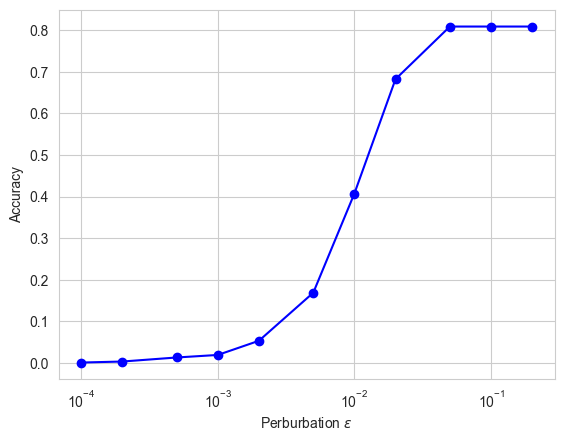

In [39]:
p=(0.0001,0.0002,0.0005,0.001,0.002,0.005,0.01,0.02,0.05,0.1,0.2)
y_values = [w / len(correct_images[:1000]) for w in arrayw]
plt.xscale('log')  
plt.plot(p,y_values, color='blue')
plt.scatter(p,y_values,color='blue')
plt.grid(True)
plt.xlabel(r'Perburbation $\epsilon$')
plt.ylabel('Accuracy')
plt.show()

In [45]:
start = 0
stop = 0.1
step = 0.0125

# Generate the list
values = [round(x, 3) for x in list(np.arange(start, stop + step, step))]

In [46]:
array_accuracy=[]
for k in values:
    step_size_attack1=2.5*k/40
    _,b,_=normal.attack_pgd(epsilon_attack=k, iterations_attack=40, step_size_attack=step_size_attack1,robustness_experiment=True)
    array_accuracy.append(b)

AxisError: axis 1 is out of bounds for array of dimension 1

In [35]:
from adversarial_training import PGDAttack
def test_bounds_attack2(model,gamma,iterations_attack,x_test,y_test):
    k=0
    for x,y in zip(x_test,y_test):
        epsilon=gamma
        step_size_attack=epsilon/iterations_attack
        

        x= tf.expand_dims(x, axis=0)
        y= tf.expand_dims(y, axis=0)#add batch dimension
        
        pgd=PGDAttack(model, epsilon=epsilon, loss_func=tf.keras.losses.MeanSquaredError(),iterations_attack=iterations_attack,step_size_attack=step_size_attack)
        adv_image = pgd.perturb(x,y)

        prediction=model_with_sign(model).predict(x).flatten()
        prediction_adv = model_with_sign(model).predict(adv_image).flatten()
        if prediction==y and prediction_adv!=y:
            k+=1
            

    return k

In [40]:
arrayw2=[]
for k in (0.0001,0.0002,0.0005,0.001,0.002,0.005,0.01,0.02,0.05,0.1,0.2):
    w2,array_with_wrong_x,array_with_wrong_y,array_with_wrong_epsilons=test_bounds_attack(normal1.model,delta_array_normal1[:1000],k,40,correct_images[:1000],correct_labels[:1000])
    arrayw2.append(w2)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━

In [ ]:
for 

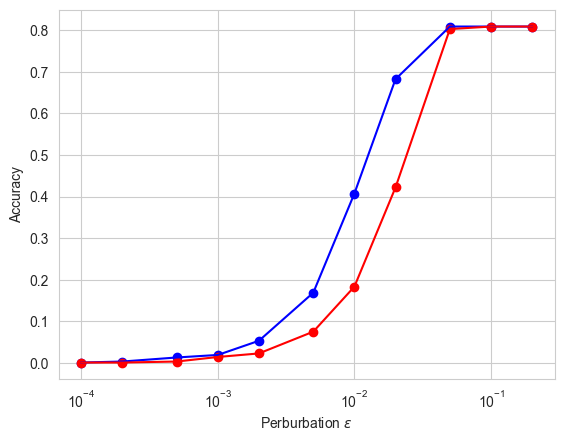

In [44]:
p=(0.0001,0.0002,0.0005,0.001,0.002,0.005,0.01,0.02,0.05,0.1,0.2)
y_values = [w / len(correct_images[:1000]) for w in arrayw]
y_values2 = [w / len(correct_images[:1000]) for w in arrayw2]
plt.xscale('log')  
plt.plot(p,y_values, color='blue')
plt.plot(p,y_values2, color='red')
plt.scatter(p,y_values,color='blue')
plt.scatter(p,y_values2,color='red')
plt.grid(True)
plt.xlabel(r'Perburbation $\epsilon$')
plt.ylabel('Accuracy')
plt.show()

In [41]:
# x= tf.expand_dims(x, axis=0)
# y= tf.expand_dims(y, axis=0)#add batch dimension
x=array_with_wrong_x[0]
y=array_with_wrong_y[0]
epsilon=l
pgd=PGDAttack(normal1.model, epsilon=l, random_start=False, loss_func=tf.keras.losses.MeanSquaredError(),iterations_attack=50,step_size_attack=0.01)
adv_image = pgd.perturb(x,y)

print(epsilon)
prediction=model_with_sign(normal1.model).predict(x).flatten()
prediction_adv = model_with_sign(normal1.model).predict(adv_image).flatten()
print(prediction),print(prediction_adv),print(y)

0.008544693819140366
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
[1.]
[-1.]
tf.Tensor([1], shape=(1,), dtype=int32)


(None, None, None)

In [44]:
a,b,c=compute_bounds(ground_model_delta_experiments1(input_shape), array_with_wrong_x[0].numpy().flatten(), l)

c:\Users\Gemeinschafts-PC\Desktop\Jonas\Masterarbeit\Implementation\env\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [48]:
from scipy.optimize import brentq
def find_max_delta(model,x, max_interval, max_iterations,activation=tf.nn.sigmoid):
    gamma=1e-7 #to make sure we are not equal to 0 

    def delta_up_function(delta):
        _,delta_up,_=compute_bounds(model, x, delta,activation)
        return delta_up
    
    def delta_low_function(delta):
        _,_,delta_low=compute_bounds(model, x, delta,activation)
        return delta_low
    
    if delta_up_function(0)<0 and delta_low_function(0)<0:
        zero_delta_up = brentq(delta_up_function, 0, max_interval, maxiter=max_iterations)
        zero_delta_up=zero_delta_up-gamma       # so we are not exactly 0 

        if delta_up_function(zero_delta_up)*delta_low_function(zero_delta_up)>0:
            return zero_delta_up
        else:
            error_message = "Error: delta_up_function(zero_delta_up)*delta_low_function(zero_delta_up) is negative!."
            raise ValueError(error_message)

        
    if delta_up_function(0)>0 and delta_low_function(0)>0:
        zero_delta_low= brentq(delta_low_function, 0, max_interval)
        zero_delta_low=zero_delta_low-gamma

        if delta_up_function(zero_delta_low)*delta_low_function(zero_delta_low)>0:
            return zero_delta_low
        else:
            error_message = "Error: delta_up_function(zero_delta_low)*delta_low_function(zero_delta_low) is negative!."
            print(delta_up_function(zero_delta_low),delta_low_function(zero_delta_low))
            raise ValueError(error_message)


    else:
        error_message = "Error: delta_up_function(0) and delta_low_function(0) have different signs!."
        raise ValueError(error_message)

In [50]:
u=find_max_delta(normal1.model,array_with_wrong_x[0].numpy().flatten(),1,50)

TypeError: compute_bounds() takes 3 positional arguments but 4 were given

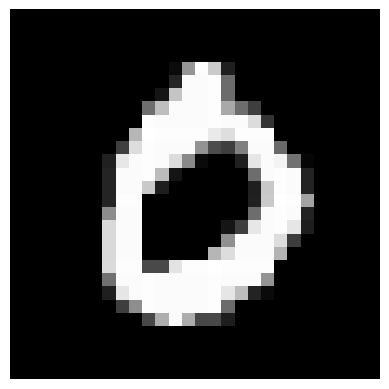

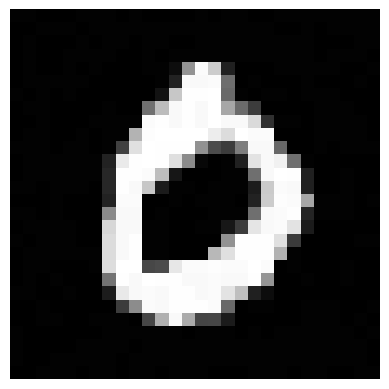

In [36]:
plt.imshow(x.numpy().reshape(28,28), cmap='gray')
plt.axis('off')
plt.show()
plt.imshow(adv_image.numpy().reshape(28,28), cmap='gray')
plt.axis('off')
plt.show()

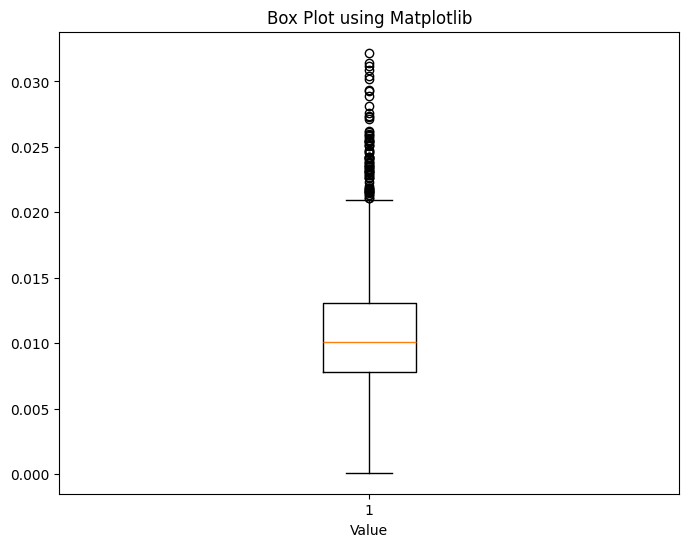

In [56]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data
data = np.random.normal(loc=0, scale=1, size=100)

# Create a box plot
plt.figure(figsize=(8, 6))
plt.boxplot(delta_array_normal)
plt.title('Box Plot using Matplotlib')
plt.xlabel('Value')
plt.show()

In [41]:
delta_array_normal,mean,medium,max,min=compute_delta_test_set(normal.model, x_test,1,50)

In [ ]:
print

In [11]:
pgd.train()

Epoch 1/100
Loss: 407.3238525390625
Epoch 2/100
Loss: 396.6277770996094
Epoch 3/100
Loss: 381.737060546875
Epoch 4/100
Loss: 330.2891845703125
Epoch 5/100
Loss: 322.0503845214844
Epoch 6/100
Loss: 318.3527526855469
Epoch 7/100
Loss: 311.934326171875
Epoch 8/100
Loss: 301.97723388671875
Epoch 9/100
Loss: 287.5676574707031
Epoch 10/100
Loss: 279.36444091796875
Epoch 11/100
Loss: 273.0838928222656
Epoch 12/100
Loss: 266.01263427734375
Epoch 13/100
Loss: 262.0906677246094
Epoch 14/100
Loss: 256.8373718261719
Epoch 15/100
Loss: 250.91790771484375
Epoch 16/100
Loss: 246.97691345214844
Epoch 17/100
Loss: 236.41546630859375
Epoch 18/100
Loss: 218.10813903808594
Epoch 19/100
Loss: 198.8910675048828
Epoch 20/100
Loss: 182.88739013671875
Epoch 21/100
Loss: 174.00828552246094
Epoch 22/100
Loss: 163.6717529296875
Epoch 23/100
Loss: 156.71844482421875
Epoch 24/100
Loss: 150.34242248535156
Epoch 25/100
Loss: 144.8008575439453
Epoch 26/100
Loss: 141.40284729003906
Epoch 27/100
Loss: 137.61557006835938

In [40]:
pgd.evaluate_model_test_set(robustness_experiment=True)

68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Accuracy on test set: 0.9935394554683895


0.9935394554683895

In [7]:
pgd.evaluate_model_test_set(robustness_experiment=True)


68/68 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Accuracy on test set: 0.9944623904014767


0.9944623904014767

In [53]:
delta_array,mean,medium,max,min=compute_delta_test_set(pgd.model, x_test,1,50)

In [16]:
import pandas as pd
df = pd.DataFrame(delta_array, columns=['Values'])

# Save the DataFrame to an Excel file
df.to_excel('pgd_delta_array.xlsx', index=False)

NameError: name 'delta_array' is not defined

In [17]:
import pandas as pd
df = pd.read_excel('delta_array_normal1.xlsx')

# Display the DataFrame
delta1=df.to_numpy()
df = pd.read_excel('delta_array_normal2.xlsx')

# Display the DataFrame
delta2=df.to_numpy()
df = pd.read_excel('delta_array_normal3.xlsx')

# Display the DataFrame
delta3=df.to_numpy()

In [18]:
mean1=np.mean(delta1)
mean2=np.mean(delta2)
mean3=np.mean(delta3)
print(mean1,mean2,mean3)

0.0003054142660204461 0.005275731107003979 0.011890310390034606


In [42]:
print(mean,medium,max,min)

0.010877743409697719 0.010118058068891343 0.03219479437036682 0.00010418286320260317


0.008616812545309178


In [44]:
import pandas as pd
df = pd.DataFrame(delta_array, columns=['Values'])

# Save the DataFrame to an Excel file
df.to_excel('normal_delta_array.xlsx', index=False)


In [14]:
print(mean,medium,max,min)

0.008616812545309178 0.006720650359654985 0.026638248365414327 0.0002470950273270236


In [47]:
df = pd.read_excel('pgd_delta_array.xlsx')

# Display the DataFrame
delta=df.to_numpy()

In [54]:
variance = np.var(delta_array_normal, ddof=1) 
print(np.sqrt(variance))

0.004568919896367762


In [49]:
print(np.mean(delta_array))

0.008616812545309178


In [50]:
print(np.mean(delta))

0.008616812545309178


In [46]:
variance = np.var(delta_array, ddof=1) 
variance1 = np.var(delta_array, ddof=0)
print(np.sqrt(variance))

0.005650438586051934


In [52]:
from scipy.optimize import brentq
def find_max_delta(model,x, max_interval, max_iterations):
    gamma=1e-7#to make sure we are not equal to 0 

    def delta_up_function(delta):
        _,delta_up,_=compute_bounds(model, x, delta)
        return delta_up
    
    def delta_low_function(delta):
        _,_,delta_low=compute_bounds(model, x, delta)
        return delta_low
    
    if delta_up_function(0)<0 and delta_low_function(0)<0:
        zero_delta_up_before = brentq(delta_up_function, 0, max_interval, maxiter=max_iterations)
        zero_delta_up=zero_delta_up_before-gamma       # so we are not exactly 0 

        if delta_up_function(zero_delta_up)*delta_low_function(zero_delta_up)>0:
            return zero_delta_up
        else:
            error_message = "Error: delta_up_function(zero_delta_up)*delta_low_function(zero_delta_up) is negative!."
            print(delta_up_function(zero_delta_up),delta_low_function(zero_delta_up))
            raise ValueError(error_message)

        
    if delta_up_function(0)>0 and delta_low_function(0)>0:
        zero_delta_low_before= brentq(delta_low_function, 0, max_interval)
        zero_delta_low=zero_delta_low_before-gamma

        if delta_up_function(zero_delta_low)*delta_low_function(zero_delta_low)>0:
            return zero_delta_low
        else:
            error_message = "Error: delta_up_function(zero_delta_low)*delta_low_function(zero_delta_low) is negative!."
            print(delta_up_function(zero_delta_low),delta_low_function(zero_delta_low))
            print(zero_delta_low_before)
            
            
            raise ValueError(error_message)


    else:
        error_message = "Error: delta_up_function(0) and delta_low_function(0) have different signs!."
        raise ValueError(error_message)
    


def compute_delta_test_set(model, x_test,max_interval, max_iterations):
    delta_array = []
    for k in x_test:
        delta = find_max_delta(model, k.flatten(),max_interval, max_iterations)
        delta_array.append(delta)

    mean=np.mean(delta_array)
    medium=np.median(delta_array)
    max=np.max(delta_array)
    min=np.min(delta_array)

    return delta_array,mean,medium,max,min


In [53]:
delta_array,mean,medium,max,min=compute_delta_test_set(pgd.model, x_test,1,100)

In [54]:
print(mean,medium,max,min)

0.023875648832233722 0.02403668465576884 0.04702463217615993 0.0008667247516396656


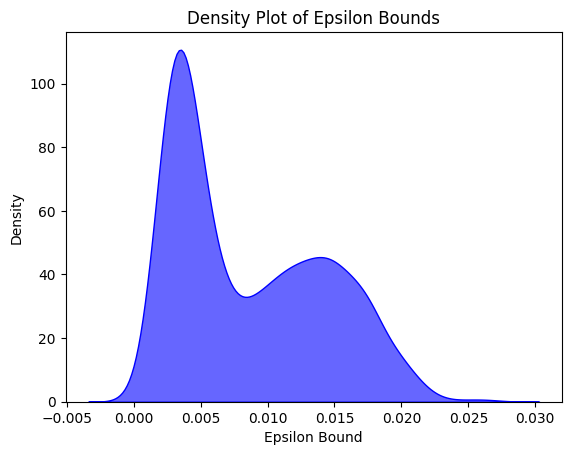

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
# Sample data: Replace this with your epsilon bounds array
epsilon_bounds = delta_array

# Create a density plot
sns.kdeplot(epsilon_bounds, fill=True, color='blue', alpha=0.6)
plt.xlabel('Epsilon Bound')
plt.ylabel('Density')
plt.title('Density Plot of Epsilon Bounds')
plt.show()

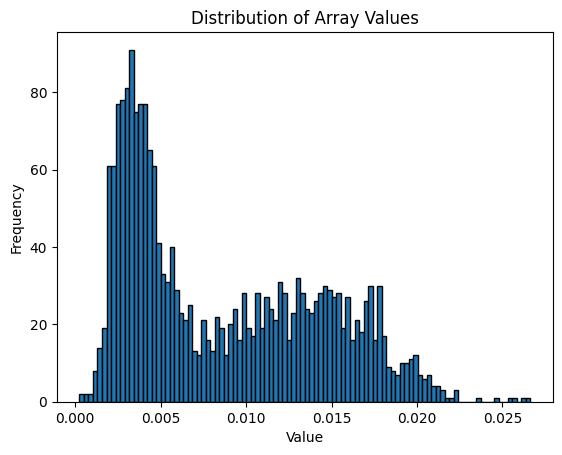

In [17]:
import matplotlib.pyplot as plt

# Sample data


# Plotting the histogram
plt.hist(epsilon_bounds, bins=100, edgecolor='black')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Distribution of Array Values')
plt.show()

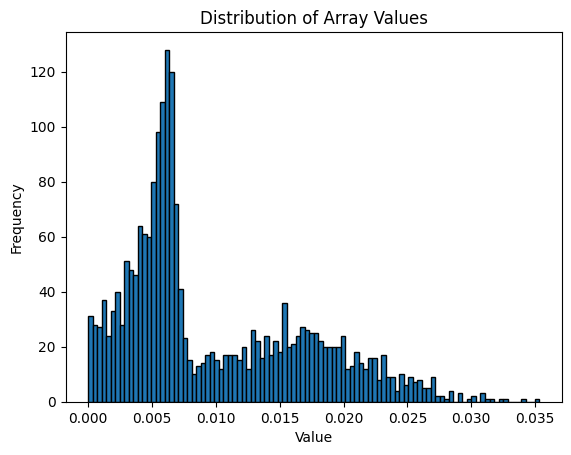

In [10]:
import matplotlib.pyplot as plt

# Sample data


# Plotting the histogram
plt.hist(delta_array, bins=100, edgecolor='black')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Distribution of Array Values')
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Sample data: Replace this with your epsilon bounds array
epsilon_bounds = np.random.normal(loc=0.2, scale=0.1, size=1000)  # Example data

# Create a density plot
sns.kdeplot(epsilon_bounds, fill=True, color='blue', alpha=0.6)
plt.xlabel('Epsilon Bound')
plt.ylabel('Density')
plt.title('Density Plot of Epsilon Bounds')
plt.show()

In [12]:
normal.train()

Epoch 1/150
Loss: 16.871551513671875
Epoch 2/150
Loss: 9.902499198913574
Epoch 3/150
Loss: 7.82172966003418
Epoch 4/150
Loss: 5.657147407531738
Epoch 5/150
Loss: 4.78267765045166
Epoch 6/150
Loss: 3.7927451133728027
Epoch 7/150
Loss: 3.3414032459259033
Epoch 8/150
Loss: 3.111391544342041
Epoch 9/150
Loss: 2.6696243286132812
Epoch 10/150
Loss: 2.2941372394561768
Epoch 11/150
Loss: 1.8398233652114868
Epoch 12/150
Loss: 1.916819453239441
Epoch 13/150
Loss: 1.5362870693206787
Epoch 14/150
Loss: 1.5490556955337524
Epoch 15/150
Loss: 1.3565566539764404
Epoch 16/150
Loss: 1.0664854049682617
Epoch 17/150
Loss: 0.7653313279151917
Epoch 18/150
Loss: 0.5467049479484558
Epoch 19/150
Loss: 0.5892161130905151
Epoch 20/150
Loss: 0.3640904426574707
Epoch 21/150
Loss: 0.22164703905582428
Epoch 22/150
Loss: 0.1431620866060257
Epoch 23/150
Loss: 0.11447726935148239
Epoch 24/150
Loss: 0.10427659004926682
Epoch 25/150
Loss: 0.09949681162834167
Epoch 26/150
Loss: 0.5457569360733032
Epoch 27/150
Loss: 0.4356

In [11]:
delta_array,mean,medium,max,min=compute_delta_test_set(normal.model, x_test,1,50)

In [12]:
print(mean,medium,max,min)

0.0006261973446175957 0.0005297086712329744 0.0018578721203674916 8.008005635643677e-06


In [4]:
fgsm.train()

Epoch 1/100
Loss: 465.1377258300781
Epoch 2/100
Loss: 309.53985595703125
Epoch 3/100
Loss: 248.57244873046875
Epoch 4/100
Loss: 205.34010314941406
Epoch 5/100
Loss: 177.57565307617188
Epoch 6/100
Loss: 155.5861053466797
Epoch 7/100
Loss: 136.93040466308594
Epoch 8/100
Loss: 115.66105651855469
Epoch 9/100
Loss: 106.18011474609375
Epoch 10/100
Loss: 93.99501037597656
Epoch 11/100
Loss: 84.9324951171875
Epoch 12/100
Loss: 80.11678314208984
Epoch 13/100
Loss: 81.4055404663086
Epoch 14/100
Loss: 82.94017791748047
Epoch 15/100
Loss: 77.14898681640625
Epoch 16/100
Loss: 75.84799194335938
Epoch 17/100
Loss: 76.58155059814453
Epoch 18/100
Loss: 77.52742767333984
Epoch 19/100
Loss: 74.11470031738281
Epoch 20/100
Loss: 69.45585632324219
Epoch 21/100
Loss: 67.26025390625
Epoch 22/100
Loss: 59.47068786621094
Epoch 23/100
Loss: 58.5833740234375
Epoch 24/100
Loss: 55.77664566040039
Epoch 25/100
Loss: 52.084007263183594
Epoch 26/100
Loss: 51.16801834106445
Epoch 27/100
Loss: 47.727420806884766
Epoch 2

In [5]:
fgsm.evaluate_model_test_set(robustness_experiment=True)


68/68 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step  
Accuracy on test set: 0.9963082602676512


0.9963082602676512

In [7]:
fgsm.attack_fgsm(epsilon_attack=0.3, random_start_attack=False, robustness_experiment=True)

68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Accuracy on adversarial test set: 0.9824642362713428
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Accuracy on test set: 0.9963082602676512


(<Sequential name=sequential_1, built=True>,
 0.9824642362713428,
 0.9963082602676512)

In [8]:
delta_array,mean,medium,max,min=compute_delta_test_set(fgsm.model, x_test,1,50)

In [9]:
print(mean,medium,max,min)

0.0007920975083863263 0.0005689964493065013 0.002556235190913654 1.265870378053781e-05


In [68]:
normal.evaluate_model_test_set(robustness_experiment=True)

68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Accuracy on test set: 0.9963082602676512


0.9963082602676512

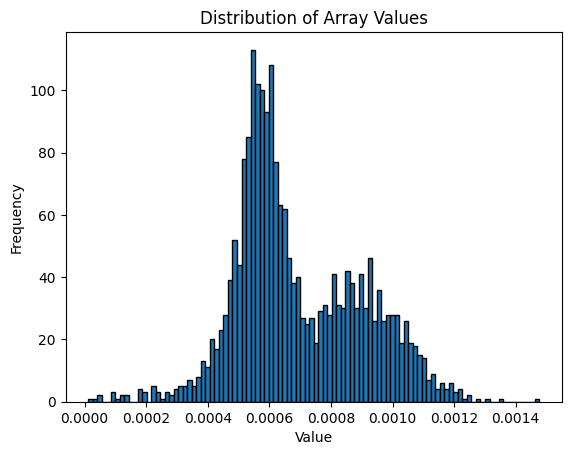

In [71]:
import matplotlib.pyplot as plt

# Sample data


# Plotting the histogram
plt.hist(delta_array, bins=100, edgecolor='black')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Distribution of Array Values')
plt.show()

In [72]:
normal.attack_fgsm(epsilon_attack=0.0014, random_start_attack=False, robustness_experiment=True)

68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Accuracy on adversarial test set: 0.9963082602676512
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Accuracy on test set: 0.9963082602676512


(<Sequential name=sequential_57, built=True>,
 0.9963082602676512,
 0.9963082602676512)

In [49]:
normal.attack_pgd(epsilon_attack=0.3, iterations_attack=40, step_size_attack=0.01, random_start_attack=False, robustness_experiment=True)

68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Accuracy on adversarial test set: 0.4960775265343793
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Accuracy on test set: 0.9963082602676512


(<Sequential name=sequential_38, built=True>,
 0.4960775265343793,
 0.9963082602676512)

In [57]:
fgsm.train()

Epoch 1/100
Loss: 659.213134765625
Epoch 2/100
Loss: 461.1976318359375
Epoch 3/100
Loss: 433.9598083496094
Epoch 4/100
Loss: 418.1141357421875
Epoch 5/100
Loss: 406.5004577636719
Epoch 6/100
Loss: 401.19378662109375
Epoch 7/100
Loss: 396.3921203613281
Epoch 8/100
Loss: 398.2737121582031
Epoch 9/100
Loss: 392.4305114746094
Epoch 10/100
Loss: 387.0846862792969
Epoch 11/100
Loss: 381.12054443359375
Epoch 12/100
Loss: 376.2370300292969
Epoch 13/100
Loss: 374.5455017089844
Epoch 14/100
Loss: 373.1872253417969
Epoch 15/100
Loss: 369.7613830566406
Epoch 16/100
Loss: 364.1305236816406
Epoch 17/100
Loss: 357.0007629394531
Epoch 18/100
Loss: 349.45452880859375
Epoch 19/100
Loss: 339.8054504394531
Epoch 20/100
Loss: 329.4406433105469
Epoch 21/100
Loss: 318.46246337890625
Epoch 22/100
Loss: 305.8432312011719
Epoch 23/100
Loss: 293.2877502441406
Epoch 24/100
Loss: 277.88409423828125
Epoch 25/100
Loss: 261.705322265625
Epoch 26/100
Loss: 245.52586364746094
Epoch 27/100
Loss: 230.30783081054688
Epoch

In [60]:
fgsm.evaluate_model_test_set(robustness_experiment=True)

68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Accuracy on test set: 0.9783110290724504


0.9783110290724504

In [63]:
delta_array,mean,medium,max,min=compute_delta_test_set(fgsm.model, x_test,1,50)

In [64]:
print(mean,medium,max,min)

0.00040786522950492606 0.00045269278707871523 0.0008991834388503645 2.3697195189592773e-07


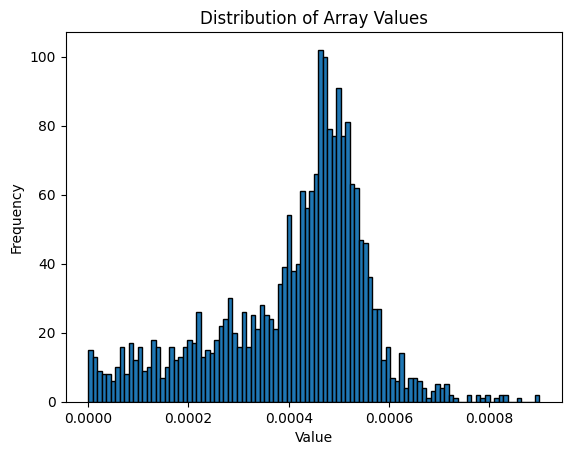

In [65]:
import matplotlib.pyplot as plt

# Sample data


# Plotting the histogram
plt.hist(delta_array, bins=100, edgecolor='black')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Distribution of Array Values')
plt.show()

In [6]:
pgd.train()

Epoch 1/100
Loss: 397.1174621582031
Epoch 2/100
Loss: 323.8718566894531
Epoch 3/100
Loss: 319.2017822265625
Epoch 4/100
Loss: 317.30615234375
Epoch 5/100
Loss: 316.25714111328125
Epoch 6/100
Loss: 315.6514892578125
Epoch 7/100
Loss: 315.3548278808594
Epoch 8/100
Loss: 314.8333435058594
Epoch 9/100
Loss: 314.6756896972656
Epoch 10/100
Loss: 314.5216979980469
Epoch 11/100
Loss: 314.36773681640625
Epoch 12/100
Loss: 314.2710266113281
Epoch 13/100
Loss: 314.1735534667969
Epoch 14/100
Loss: 314.0665283203125
Epoch 15/100
Loss: 313.92388916015625
Epoch 16/100
Loss: 313.85260009765625
Epoch 17/100
Loss: 313.7342834472656
Epoch 18/100
Loss: 313.7727966308594
Epoch 19/100
Loss: 313.74755859375
Epoch 20/100
Loss: 313.6822814941406
Epoch 21/100
Loss: 313.6880798339844
Epoch 22/100
Loss: 313.54962158203125
Epoch 23/100
Loss: 313.5685119628906
Epoch 24/100
Loss: 313.6167297363281
Epoch 25/100
Loss: 313.5002746582031
Epoch 26/100
Loss: 313.4985046386719
Epoch 27/100
Loss: 313.4742431640625
Epoch 28/

In [7]:
pgd.evaluate_model_test_set(robustness_experiment=True)


32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Accuracy on test set: 0.544


0.544

In [26]:
def custom_sign(x):
        return tf.sign(x)

In [27]:
# model_with_sign = tf.keras.models.Sequential([
# pgd.model,                       
# tf.keras.layers.Lambda(custom_sign)          
# ])


# predictions = model_with_sign.predict(x_test[:100])


# predictions = predictions.astype(int)


# accuracy = np.mean(predictions.flatten() == y_test[:100])
# print(f'Accuracy: {accuracy * 100:.2f}%')

model_with_sign1 = tf.keras.models.Sequential([
fgsm.model,                       
tf.keras.layers.Lambda(custom_sign)          
])


predictions = model_with_sign1.predict(x_test)


predictions = predictions.astype(int)


accuracy = np.mean(predictions.flatten() == y_test)
print(f'Accuracy: {accuracy * 100:.2f}%')
                    
                    

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Accuracy: 52.20%


In [15]:
predictions = model_with_sign1.predict(x_test[:1000])
accuracy = np.mean(np.equal(y_test[:1000], predictions.flatten()))
print(accuracy)
#print(f'Accuracy: {accuracy * 100:.2f}%')

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
0.96


In [6]:
normal.attack_pgd(epsilon_attack=0.3, iterations_attack=40, step_size_attack=0.01, random_start_attack=False,robustness_experiment=True)


32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Accuracy on adversarial test set: 0.372
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Accuracy on test set: 0.96


(<Sequential name=sequential, built=True>, 0.372, 0.96)

In [9]:
a=normal.evaluate_model_test_set(robustness_experiment=True)

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Accuracy on test set: 0.96


In [15]:
delta_array,mean,medium,max,min=compute_delta_test_set(normal.model,x_test,1,50)

In [16]:
print(f'mean: {mean}, medium: {medium}, max: {max}, min: {min}')

mean: 0.00028989547921884427, medium: 0.0002936845615088725, max: 0.0007746230374313534, min: 2.3755549040268424e-07


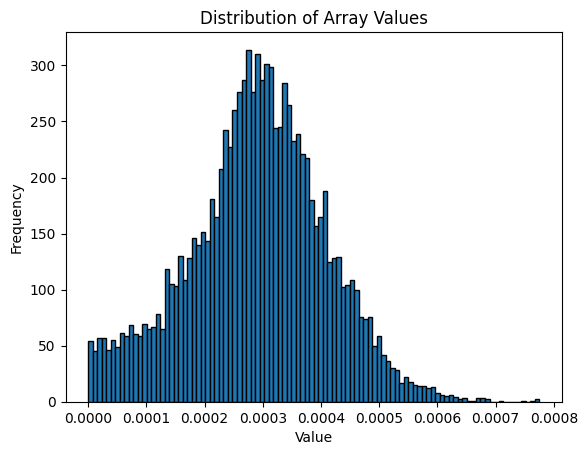

In [17]:
import matplotlib.pyplot as plt

# Sample data


# Plotting the histogram
plt.hist(delta_array, bins=100, edgecolor='black')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Distribution of Array Values')
plt.show()

In [11]:
delta=find_max_delta(normal.model,x_test[:1000].flatten(),tf.nn.relu, 1.0, 50)

TypeError: find_max_delta() takes 4 positional arguments but 5 were given

In [52]:
a,b,c,d=compare2models_trained(normal.model,pgd.model,x_test[:1000],y_test[:1000])

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
accuracy: 0.713
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
accuracy: 0.456
Number of correctly classified images by all models: 366


In [53]:
print(a,b,c,d)

[0.0002961565205689278, 0.0013604955807126333] [0.0002663046496810869, 0.0013280182423259601] [0.0008684649772299446, 0.0026202455599040717] [5.71487600369816e-06, 0.000497150901551996]


In [2]:
def load_and_preprocess_images(image_dir, target_size=(128, 128)):
    images = []
    labels = []
    for class_name in ['Cat', 'Dog']:
        class_dir = os.path.join(image_dir, class_name)
        for filename in os.listdir(class_dir):
            if filename.endswith(".jpg") or filename.endswith(".png"):  # Check for common image extensions
                img_path = os.path.join(class_dir, filename)
                try:
                    img = load_img(img_path, target_size=target_size)
                    img_array = img_to_array(img)
                    img_array = img_array / 255.0  # normalize
                    images.append(img_array)
                    labels.append(1 if class_name == 'Dog' else -1)  # Dog -> 1, Cat -> -1
                except Exception as e:
                    print(f"Error: {e}, file: {img_path}")
    return np.array(images), np.array(labels)

def cats_vs_dogs_data_and_preprocessing(image_dir, test_size=0.2):
    # Load and preprocess images
    images, labels = load_and_preprocess_images(image_dir)
    
    # Split the dataset into training and testing sets
    x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=test_size, random_state=42)
    
    return x_train, y_train, x_test, y_test

In [3]:
image_dir = r'C:\Users\Gemeinschafts-PC\Desktop\Jonas\Masterarbeit\Implementation\PetImages'

x_train, y_train, x_test, y_test = cats_vs_dogs_data_and_preprocessing(image_dir)

Error: cannot identify image file <_io.BytesIO object at 0x00000209E0CAA3E0>, file: C:\Users\Gemeinschafts-PC\Desktop\Jonas\Masterarbeit\Implementation\PetImages\Cat\666.jpg
Error: cannot identify image file <_io.BytesIO object at 0x00000209E0D65C10>, file: C:\Users\Gemeinschafts-PC\Desktop\Jonas\Masterarbeit\Implementation\PetImages\Dog\11702.jpg


c:\Users\Gemeinschafts-PC\Desktop\Jonas\Masterarbeit\Implementation\env\Lib\site-packages\PIL\TiffImagePlugin.py:900: UserWarning: Truncated File Read
  warnings.warn(str(msg))


In [4]:
from training_model import train_model


In [8]:
a,b,c,d=train_model('relu',x_train[:10000], y_train[:10000], x_test[:100], y_test[:100], epochs=10, batch_size=32, verbose=1,input_shape=(128, 128, 3))

c:\Users\Gemeinschafts-PC\Desktop\Jonas\Masterarbeit\Implementation\env\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - custom_sign_metric: 0.5112 - loss: 265.1107
Epoch 2/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - custom_sign_metric: 0.5253 - loss: 2.5592
Epoch 3/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 42s 134ms/step - custom_sign_metric: 0.5600 - loss: 1.3609
Epoch 4/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - custom_sign_metric: 0.5593 - loss: 1.5011
Epoch 5/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - custom_sign_metric: 0.5550 - loss: 1.6208
Epoch 6/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - custom_sign_metric: 0.5727 - loss: 1.2653
Epoch 7/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - custom_sign_metric: 0.5584 - loss: 2.5543
Epoch 8/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - custom_sign_metric: 0.5802 - loss: 1.1233
Epoch 9/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - custom_sign_metric: 0.5907 - loss: 1.1412
Epoch 10/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - custom_sign_metric: 0.5834 - loss: 1.1885
4/4 ━━━

In [11]:
predictions = d.predict(x_test[:100])

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


In [13]:
correct_indices = np.where(predictions.flatten() == y_test[:100])[0]

In [16]:
x_test_correct = x_test[correct_indices]

In [5]:
from delta_experiments_algorithms import find_max_delta,compute_bounds,test_iterations_influence
from training_model import ground_model_cats_vs_dogs

In [6]:
mean, medium, max, min, loss, acc=test_iterations_influence(ground_model_cats_vs_dogs,x_train, y_train, x_test, y_test, 10, 32,tf.nn.relu,1,input_shape=(128, 128, 3))


c:\Users\Gemeinschafts-PC\Desktop\Jonas\Masterarbeit\Implementation\env\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


625/625 ━━━━━━━━━━━━━━━━━━━━ 83s 132ms/step - custom_sign_metric: 0.5185 - loss: 103.3514
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - custom_sign_metric: 0.5245 - loss: 1.5486

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step
Accuracy: 51.26%
Epoch 1/2
625/625 ━━━━━━━━━━━━━━━━━━━━ 83s 131ms/step - custom_sign_metric: 0.5258 - loss: 141.7381
Epoch 2/2
625/625 ━━━━━━━━━━━━━━━━━━━━ 82s 131ms/step - custom_sign_metric: 0.5486 - loss: 1.4860
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - custom_sign_metric: 0.4975 - loss: 1.7795
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
Accuracy: 50.66%
Epoch 1/3
625/625 ━━━━━━━━━━━━━━━━━━━━ 83s 131ms/step - custom_sign_metric: 0.5126 - loss: 183.7274
Epoch 2/3
625/625 ━━━━━━━━━━━━━━━━━━━━ 82s 131ms/step - custom_sign_metric: 0.5284 - loss: 1.7472
Epoch 3/3
625/625 ━━━━━━━━━━━━━━━━━━━━ 82s 131ms/step - custom_sign_metric: 0.5393 - loss: 2.3202
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - custom_sign_metric: 0.5742 - loss: 1.0169
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
Acc

In [8]:
print(mean)

[0.0003606584285972339, 0.00044434135269242367, 0.00013486830662939875, 0.0004674763103419535, 0.0006546193716532656, 0.0003962999420524447, 0.0010263100670200541, 0.00037414208518160715, 0.0008937023960189864, 0.00100650874872379]


In [ ]:
plt.scatter(loss,mean
            
            
            )
plt.grid(True)
plt.show()

In [ ]:
def test_iterations_influence(x_train, y_train, x_test, y_test, max_epochs, batch_size, activation,verbose):

In [21]:
delta=find_max_delta(c,x_test_correct[1].flatten(),tf.nn.relu, 1.0, 100)

In [22]:
print(delta)

7.308571058783204e-06


In [3]:
x_train, y_train, x_test, y_test=mnist_binary_data_and_preprocessing()


In [12]:
mean, medium, max, min, loss, acc=test_iterations_influence(x_train, y_train, x_test, y_test,10,x_train.shape[0],tf.nn.relu,0)

c:\Users\Gemeinschafts-PC\Desktop\Jonas\Masterarbeit\Implementation\env\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\Gemeinschafts-PC\Desktop\Jonas\Masterarbeit\Implementation\env\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - custom_sign_metric: 0.9611 - loss: 0.4173
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Accuracy: 96.86%
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - custom_sign_metric: 0.9206 - loss: 0.2745
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Accuracy: 94.14%
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - custom_sign_metric: 0.9745 - loss: 0.1792
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Accuracy: 97.92%
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - custom_sign_metric: 0.9385 - loss: 0.2656
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Accuracy: 95.29%
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 700us/step - custom_sign_metric: 0.9846 - loss: 0.1329
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Accuracy: 98.89%
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 827us/step - custom_sign_metric: 0.9913 - loss: 0.1218
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Accuracy: 99.35%
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 715us/step - custom_sign_metric: 0.9931 - loss: 0.1236
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Accuracy: 99.45%
68/68 ━━━━━

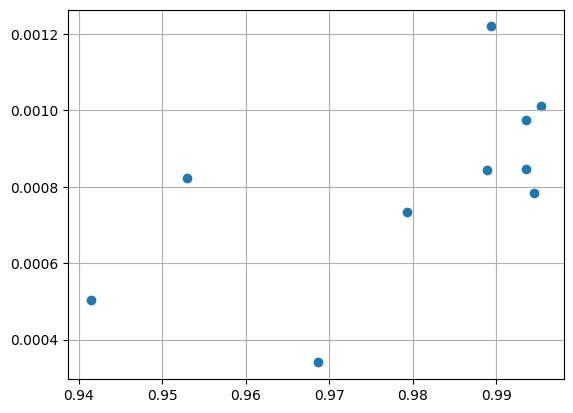

In [17]:
plt.scatter(loss,mean
            
            
            )
plt.grid(True)
plt.show()

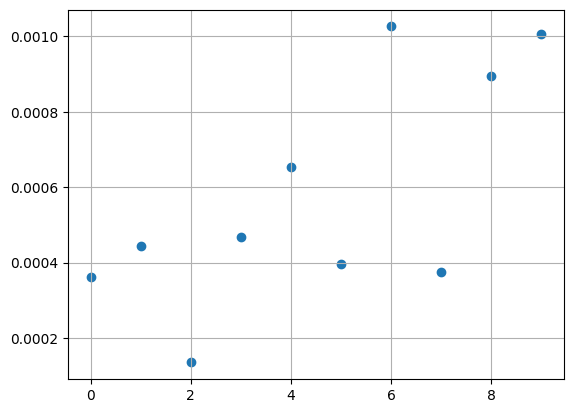

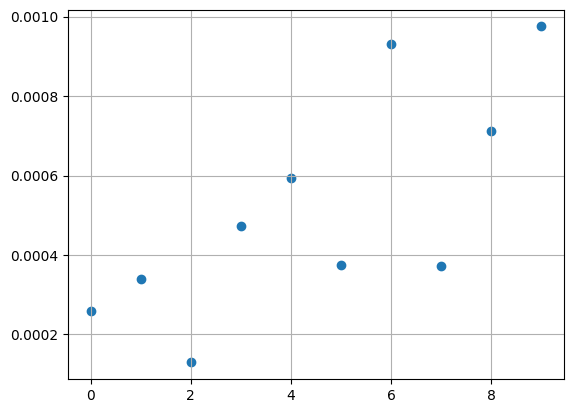

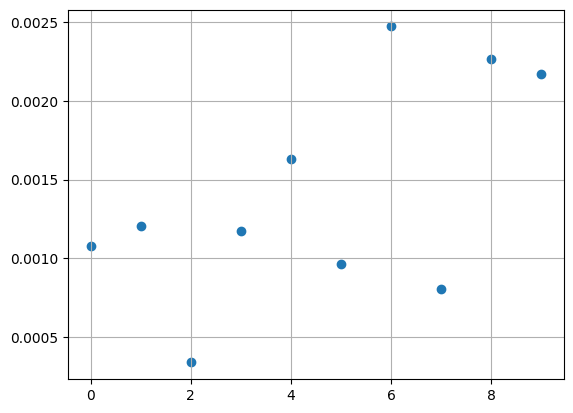

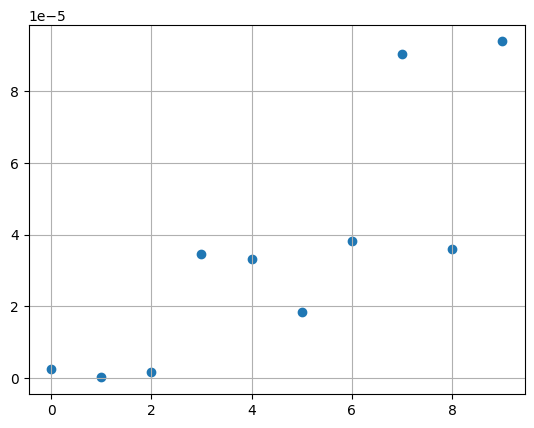

In [9]:
plt.scatter(range(10),mean)

plt.grid(True)
plt.show()
plt.scatter(range(10),medium)
plt.grid(True)
plt.show()
plt.scatter(range(10),max)
plt.grid(True)
plt.show()
plt.scatter(range(10),min)
plt.grid(True)
plt.show()

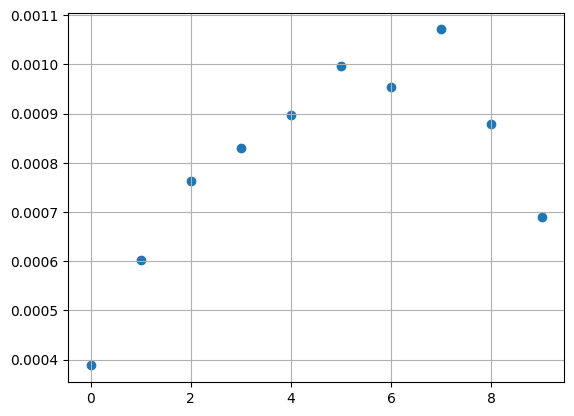

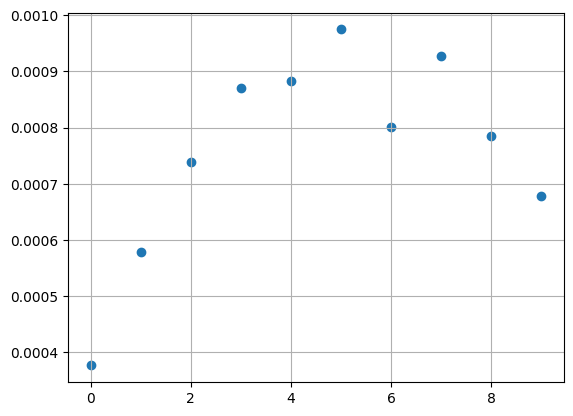

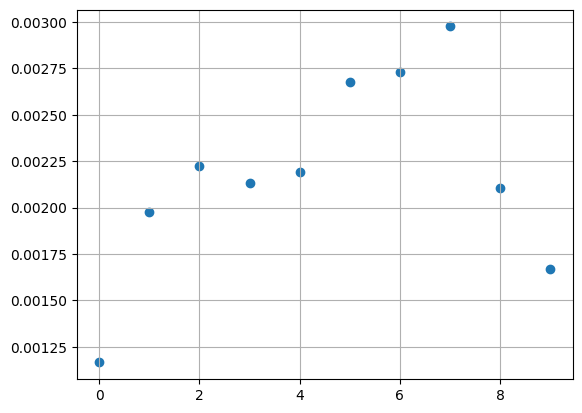

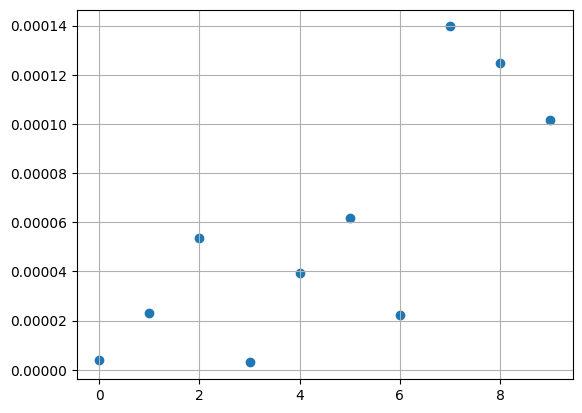

In [11]:
plt.scatter(range(10),mean)

plt.grid(True)
plt.show()
plt.scatter(range(10),medium)
plt.grid(True)
plt.show()
plt.scatter(range(10),max)
plt.grid(True)
plt.show()
plt.scatter(range(10),min)
plt.grid(True)
plt.show()

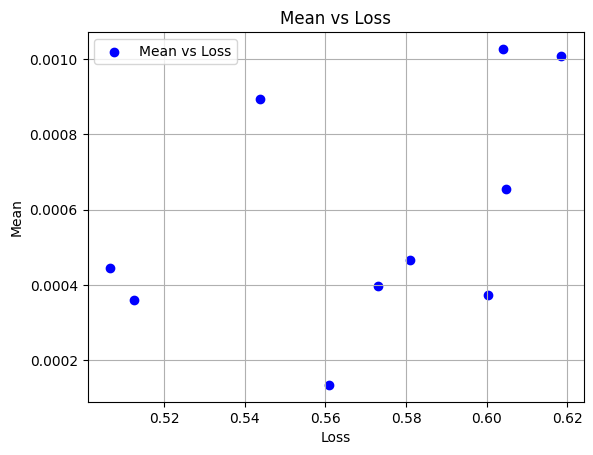

In [10]:
plt.scatter(loss, mean, color='blue', label='Mean vs Loss', marker='o')

plt.xlabel('Loss')
plt.ylabel('Mean')
plt.title('Mean vs Loss')
plt.legend()
plt.grid(True)
plt.show()

In [5]:
print(mean, medium, max, min, loss, acc)

[0.00040490628634523525] [0.0003566986460568324] [0.0015933810044085975] [4.599411889746713e-07] [0.9690816797415782] [0.29286909103393555]


In [24]:
# Create a simple model with tanh activation for all layers
    # Dense(1000, activation='tanh'),
    # Dense(600, activation='tanh'),


def custom_sign_metric(y_true, y_pred):
    y_pred_sign = tf.sign(y_pred)
    
    y_pred_sign = tf.squeeze(y_pred_sign)  #different shapes otherwise and completly wrong accuracy!!!
   
    y_true = tf.cast(y_true, tf.int32)
    
    y_pred_sign = tf.cast(y_pred_sign, tf.int32)
    
    accuracy = tf.reduce_mean(tf.cast(tf.equal(y_true, y_pred_sign), tf.float32))

    return accuracy

input_shape = (28, 28, 1)
model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=input_shape),
    tf.keras.layers.Dense(512, input_shape=(784,), activation='relu'),  
    tf.keras.layers.Dense(64, activation='relu'),                        
    tf.keras.layers.Dense(1)                               
])


# model = tf.keras.models.Sequential([
#     tf.keras.layers.Flatten(input_shape=input_shape),
#     tf.keras.layers.Dense(10, input_shape=(784,), activation='relu'),  
#     tf.keras.layers.Dense(5, activation='relu'),                        
#     tf.keras.layers.Dense(1)                               
# ])


# Compile the model
model.compile(optimizer='adam', loss='MSE', metrics=[custom_sign_metric])



# Train the model
model.fit(x_train, y_train, epochs=10, batch_size=x_train.shape[0])


# Evaluate the model




loss,_ = model.evaluate(x_test, y_test)

def custom_sign(x):
    return tf.sign(x)


model_with_sign = tf.keras.models.Sequential([
    model,                       
    tf.keras.layers.Lambda(custom_sign)          
])


predictions = model_with_sign.predict(x_test)


predictions = predictions.astype(int)

accuracy = np.mean(predictions.flatten() == y_test)
print(f'Accuracy: {accuracy * 100:.2f}%')
print(f'Loss: {loss:.4f}')



Epoch 1/10


c:\Users\Gemeinschafts-PC\Desktop\Jonas\Masterarbeit\Implementation\env\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\Gemeinschafts-PC\Desktop\Jonas\Masterarbeit\Implementation\env\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 890ms/step - custom_sign_metric: 0.5573 - loss: 1.0478
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - custom_sign_metric: 0.8853 - loss: 0.4632
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - custom_sign_metric: 0.9747 - loss: 0.2227
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - custom_sign_metric: 0.9769 - loss: 0.1741
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - custom_sign_metric: 0.9686 - loss: 0.2276
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - custom_sign_metric: 0.9768 - loss: 0.1806
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - custom_sign_metric: 0.9861 - loss: 0.1179
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - custom_sign_metric: 0.9887 - loss: 0.1003
Epoch 9/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - custom_sign_metric: 0.9891 - loss: 0.1133
Epoch 10/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - custom_sign_metric: 0.9892 - loss: 0.1204
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 762us/step - custom_sign_metric: 0.9922 - loss: 

In [32]:
def custom_sign(x):
        return tf.sign(x)

def custom_sign_metric(y_true, y_pred):
    y_pred_sign = tf.sign(y_pred)
    
    y_pred_sign = tf.squeeze(y_pred_sign)  #different shapes otherwise and completly wrong accuracy!!!
   
    y_true = tf.cast(y_true, tf.int32)
    
    y_pred_sign = tf.cast(y_pred_sign, tf.int32)
    
    accuracy = tf.reduce_mean(tf.cast(tf.equal(y_true, y_pred_sign), tf.float32))

    return accuracy


def ground_model(activation,input_shape):

    model = tf.keras.models.Sequential([
        tf.keras.layers.Flatten(input_shape=input_shape),
        tf.keras.layers.Dense(512, input_shape=(784,), activation=activation),  
        tf.keras.layers.Dense(64, activation=activation),                        
        tf.keras.layers.Dense(1)                               
    ])
    return model

def train_model(activation, x_train, y_train, x_test, y_test, epochs, batch_size,verbose):


    input_shape = (28, 28, 1)
    model = ground_model(activation, input_shape)

    model.compile(optimizer='adam', loss='MSE', metrics=[custom_sign_metric])



# Train the model
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size,verbose=verbose)

    loss,_ = model.evaluate(x_test, y_test)


    model_with_sign = tf.keras.models.Sequential([
        model,                       
        tf.keras.layers.Lambda(custom_sign)          
    ])


    predictions = model_with_sign.predict(x_test)


    predictions = predictions.astype(int)


    accuracy = np.mean(predictions.flatten() == y_test)
    print(f'Accuracy: {accuracy * 100:.2f}%')
                    

    return accuracy, loss, model, model_with_sign






# model = tf.keras.models.Sequential([
#     tf.keras.layers.Flatten(input_shape=input_shape),
#     tf.keras.layers.Dense(10, input_shape=(784,), activation='relu'),  
#     tf.keras.layers.Dense(5, activation='relu'),                        
#     tf.keras.layers.Dense(1)                               
# ])


# Compile the model


In [35]:
a,b,d,c=train_model('relu',x_train, y_train, x_test, y_test, 10, x_train.shape[0],1)

Epoch 1/10


c:\Users\Gemeinschafts-PC\Desktop\Jonas\Masterarbeit\Implementation\env\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\Gemeinschafts-PC\Desktop\Jonas\Masterarbeit\Implementation\env\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 726ms/step - custom_sign_metric: 0.4540 - loss: 1.1447
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - custom_sign_metric: 0.9068 - loss: 0.4690
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - custom_sign_metric: 0.9731 - loss: 0.2418
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - custom_sign_metric: 0.9738 - loss: 0.1665
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - custom_sign_metric: 0.9665 - loss: 0.2086
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - custom_sign_metric: 0.9773 - loss: 0.1760
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - custom_sign_metric: 0.9863 - loss: 0.1232
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - custom_sign_metric: 0.9887 - loss: 0.1016
Epoch 9/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - custom_sign_metric: 0.9889 - loss: 0.1013
Epoch 10/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - custom_sign_metric: 0.9892 - loss: 0.1067
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 808us/step - custom_sign_metric: 0.9937 - loss: 0

In [59]:

model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=input_shape),
    tf.keras.layers.Dense(512, input_shape=(784,), activation=tf.nn.relu),  
    tf.keras.layers.Dense(64, activation=tf.nn.relu),                        
    tf.keras.layers.Dense(1)                               
])

c:\Users\Gemeinschafts-PC\Desktop\Jonas\Masterarbeit\Implementation\env\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\Gemeinschafts-PC\Desktop\Jonas\Masterarbeit\Implementation\env\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [66]:
# input_shape = (28, 28, 1)
# model = tf.keras.models.Sequential([
#     tf.keras.layers.Flatten(input_shape=input_shape),
#     tf.keras.layers.Dense(512, input_shape=(784,), activation='relu'),  
#     tf.keras.layers.Dense(64, activation='relu'),                        tf.nn.relu
#     tf.keras.layers.Dense(1)                               
# ])


def test_iterations_influence(x_train, y_train, x_test, y_test, max_epochs, batch_size, activation,verbose):
    """testing the influence of the number of iterations/loss/acc on the delta"""
    loss=[]
    acc=[]
    trained_models=[]
    trained_models_sign=[]

    correct_classified_x= x_test
    correct_classified_y= y_test

    for i in range(1, max_epochs + 1):
        loss_iter,acc_iter,trained_model,trained_model_sign=train_model(activation, x_train, y_train, x_test, y_test, i, batch_size,verbose)
        loss.append(loss_iter)
        acc.append(acc_iter)

        trained_models.append(trained_model)
        trained_models_sign.append(trained_model_sign)


    correct_indices_per_model = []


    for model in trained_models_sign:
       
        prediction = model.predict(x_test)
        
        
        correct_indices = np.where(prediction.flatten() == y_test)[0]
        print(y_test.shape)
        print(correct_indices.shape)

        correct_indices_per_model.append(set(correct_indices))


    common_correct_indices = set.intersection(*correct_indices_per_model)

    # we only want the images which are correctly classified by all models, as our algo works only for correct onse! 
    correct_classified_x = x_test[list(common_correct_indices)]
    


    mean=[]
    medium=[]
    max=[]
    min=[]

    for i in range(1, max_epochs + 1):
        
        delta_array=[]

        for k in correct_classified_x:
            delta=find_max_delta(trained_models[i], k.flatten(), activation,max_interval=1, max_iterations=100)
            delta_array.append(delta)
    
        mean.append(np.mean(delta_array))
        medium.append(np.median(delta_array))
        max.append(np.max(delta_array))
        min.append(np.min(delta_array))

    return  mean, medium, max, min, loss, acc








    for i in range(1, max_epochs + 1):
    
        predicted=model_with_sign.predict(correct_classified_x)
        

        filter = np.where((correct_classified_y == predicted))
        correct_classified_y=correct_classified_y[filter]
        correct_classified_x=correct_classified_x[filter]
        correct_classified_y=train_filter = np.where((y_train == 1) | (y_train == 2))

        find_max_delta(model, x_train, y_train, x_test, y_test)


In [67]:
a,b=test_iterations_influence(x_train, y_train, x_test, y_test, 1, x_train.shape[0], tf.nn.relu,0)

Epochs: 1


c:\Users\Gemeinschafts-PC\Desktop\Jonas\Masterarbeit\Implementation\env\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\Gemeinschafts-PC\Desktop\Jonas\Masterarbeit\Implementation\env\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 789us/step - custom_sign_metric: 0.9276 - loss: 0.4842
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Accuracy: 92.94%
Epochs: 2
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 763us/step - custom_sign_metric: 0.9557 - loss: 0.2269
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Accuracy: 96.63%
Epochs: 3
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - custom_sign_metric: 0.9285 - loss: 0.3196
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Accuracy: 94.32%
Epochs: 4
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 759us/step - custom_sign_metric: 0.9713 - loss: 0.2292
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Accuracy: 97.83%
Epochs: 5
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 738us/step - custom_sign_metric: 0.9815 - loss: 0.1353
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Accuracy: 98.85%
Epochs: 6
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 807us/step - custom_sign_metric: 0.9725 - loss: 0.1748
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Accuracy: 97.92%
Epochs: 7
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 837us/step - custom_sign_metric: 0.9925 - loss: 0.1006
68/68 ━━━

KeyboardInterrupt: 

(1982, 28, 28)
(2167, 28, 28)


In [12]:
print(x_test[:1].shape)
print(x_test[:1].flatten().shape)
delta=find_max_delta(model,x_test[1].flatten(),tf.nn.relu,0.5,100)
print(delta)

(1, 28, 28)
(784,)
dense_layer 1
(784, 512)
dense_layer 2
(512, 64)
dense_layer 1
(784, 512)
dense_layer 2
(512, 64)
dense_layer 1
(784, 512)
dense_layer 2
(512, 64)
dense_layer 1
(784, 512)
dense_layer 2
(512, 64)
dense_layer 1
(784, 512)
dense_layer 2
(512, 64)
dense_layer 1
(784, 512)
dense_layer 2
(512, 64)
dense_layer 1
(784, 512)
dense_layer 2
(512, 64)
dense_layer 1
(784, 512)
dense_layer 2
(512, 64)
dense_layer 1
(784, 512)
dense_layer 2
(512, 64)
dense_layer 1
(784, 512)
dense_layer 2
(512, 64)
dense_layer 1
(784, 512)
dense_layer 2
(512, 64)
dense_layer 1
(784, 512)
dense_layer 2
(512, 64)
dense_layer 1
(784, 512)
dense_layer 2
(512, 64)
0.002076192370342031


In [10]:
delta=0.1
import numpy as np
x_final,x_delta_up,x_delta_low=compute_bounds(model,x_test[1].flatten(),delta,tf.nn.relu)



dense_layer 1
(784, 512)


InvalidArgumentError: {{function_node __wrapped____MklMatMul_device_/job:localhost/replica:0/task:0/device:CPU:0}} Matrix size-incompatible: In[0]: [1,3920], In[1]: [784,512] [Op:MatMul] name: 

In [326]:
input_shape = (28, 28, 1)


mnist = tf.keras.datasets.mnist
(x_train, y_train), (x_test, y_test) = mnist.load_data()
train_filter = np.where((y_train == 1) | (y_train == 2))
test_filter = np.where((y_test == 1) | (y_test == 2))

x_train, y_train = x_train[train_filter], y_train[train_filter]
x_test, y_test = x_test[test_filter], y_test[test_filter]
x_train=x_train / 255.0
x_test=x_test/255.0

array([2, 1, 1, ..., 2, 1, 2], dtype=uint8)

In [327]:
y_train = y_train.astype(np.int32)
y_test = y_test.astype(np.int32)

y_train[y_train == 2] = -1
y_test[y_test == 2] = -1
y_train[y_train == -1] 

array([-1, -1, -1, ..., -1, -1, -1])

In [328]:
print(y_train[y_train == 1].shape)
y_train.shape

(6742,)


(12700,)

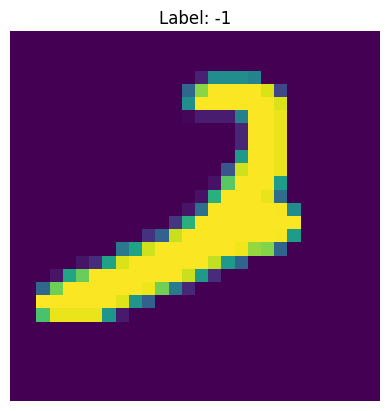

In [329]:
pic=103

plt.imshow(x_train[pic])
plt.title(f'Label: {y_train[pic]}')
plt.axis('off')
plt.show()

In [332]:
# Create a simple model with tanh activation for all layers
    # Dense(1000, activation='tanh'),
    # Dense(600, activation='tanh'),


def custom_sign_metric(y_true, y_pred):
    y_pred_sign = tf.sign(y_pred)
    
    y_pred_sign = tf.squeeze(y_pred_sign)  #different shapes otherwise and completly wrong accuracy!!!
   
    y_true = tf.cast(y_true, tf.int32)
    
    y_pred_sign = tf.cast(y_pred_sign, tf.int32)
    
    accuracy = tf.reduce_mean(tf.cast(tf.equal(y_true, y_pred_sign), tf.float32))

    return accuracy


model = tf.keras.layers.Sequential([
    tf.keras.layers.Flatten(input_shape=input_shape),
    tf.keras.layers.Dense(512, input_shape=(784,), activation='relu'),  
    tf.keras.layers.Dense(64, activation='relu'),                        
    tf.keras.layers.Dense(1)                               
])

# Compile the model
model.compile(optimizer='adam', loss='MSE', metrics=[custom_sign_metric])



# Train the model
model.fit(x_train, y_train, epochs=10, batch_size=32)



def custom_sign(x):
    return tf.sign(x)


model_with_sign = tf.keras.models.Sequential([
    model,                       
    tf.keras.layers.Lambda(custom_sign)          
])


predictions = model_with_sign.predict(x_test)


predictions = predictions.astype(int)


accuracy = np.mean(predictions.flatten() == y_test)
print(f'Accuracy: {accuracy * 100:.2f}%')

Epoch 1/10


c:\Users\Gemeinschafts-PC\Desktop\Jonas\Masterarbeit\Implementation\env\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
c:\Users\Gemeinschafts-PC\Desktop\Jonas\Masterarbeit\Implementation\env\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


397/397 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - custom_sign_metric: 0.9829 - loss: 0.0898
Epoch 2/10
397/397 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - custom_sign_metric: 0.9974 - loss: 0.0183
Epoch 3/10
397/397 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - custom_sign_metric: 0.9989 - loss: 0.0097
Epoch 4/10
397/397 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - custom_sign_metric: 0.9998 - loss: 0.0044
Epoch 5/10
397/397 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - custom_sign_metric: 0.9997 - loss: 0.0048
Epoch 6/10
397/397 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - custom_sign_metric: 1.0000 - loss: 0.0030
Epoch 7/10
397/397 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - custom_sign_metric: 1.0000 - loss: 0.0026
Epoch 8/10
397/397 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - custom_sign_metric: 0.9998 - loss: 0.0033
Epoch 9/10
397/397 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - custom_sign_metric: 0.9999 - loss: 0.0026
Epoch 10/10
397/397 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - custom_sign_metric: 0.9998 - loss: 0.0021
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Accuracy:

In [359]:

def compute_bounds(model, x, delta,activation):
    """ compute bounds"""
    
    
    x = tf.convert_to_tensor(x, dtype=tf.float32)
    delta = tf.convert_to_tensor(delta, dtype=tf.float32)
    #add batch dimension:
    
    if len(x.shape) <2:
        x= np.expand_dims(x, axis=0)

    # Initialize
    x_curr = x
    
    delta_up = delta * tf.ones_like(x)
    delta_low = delta * tf.ones_like(x)
    layer_counter=0
    # Propagate through each layer
    for layer in model.layers:
        if isinstance(layer, tf.keras.layers.Dense):
            if layer_counter<len(model.layers)-1:
                print('dense_layer',layer_counter)
                print(layer.kernel.shape)
                
                W = layer.kernel
                b = layer.bias
                
                
                
                W_positive, W_negative = positive_negative_parts(W)
                x_next = activation(tf.matmul(x_curr,W) + b)
                delta_up_new=activation(tf.matmul(x_curr,W)+tf.matmul(delta_up,W_positive)+tf.matmul(delta_low,W_negative)+b)-x_next
                delta_low_new=-activation(tf.matmul(x_curr,W)-tf.matmul(delta_low,W_positive)-tf.matmul(delta_up,W_negative)+b)+x_next

                x_curr=x_next
                delta_up=delta_up_new
                delta_low=delta_low_new

                layer_counter+=1
            
            else:
                print('last_layer',layer_counter)
                print(layer.kernel.shape)
                W = layer.kernel
                b = layer.bias
                W_positive, W_negative = positive_negative_parts(W)

                x_final = tf.matmul(x_curr,W) + b
               
                delta_up_new = tf.matmul(delta_up,W_positive)+tf.matmul(delta_low,W_negative)
                delta_low_new=tf.matmul(delta_low,W_positive)+tf.matmul(delta_up,W_negative)
                
                delta_up=delta_up_new
                delta_low=delta_low_new


        else:
            print('otherlayer',layer_counter)
            layer_counter+=1
            
    x_delta_up=x_final + delta_up
    x_delta_low=x_final - delta_low     
    return x_final.numpy().flatten(),x_delta_up.numpy().flatten(), x_delta_low.numpy().flatten()         


In [360]:
#delta=find_max_delta(model, x_test[i:i+1].flatten(),tf.nn.relu, 1, 100)
delta=0.1
x,x_delta_up,x_delta_low=compute_bounds(model, x_test[:1].flatten(), delta,tf.nn.relu)

otherlayer 0
dense_layer 1
(784, 512)
dense_layer 2
(512, 64)
last_layer 3
(64, 1)


In [ ]:
model = Sequential([
    tf.keras.layers.Flatten(input_shape=input_shape),
    Dense(512, input_shape=(input_dim,), activation='relu'),  
    Dense(64, activation='relu'),                        
    Dense(1)                               
])

In [344]:
x_test.shape

(2167, 28, 28)

In [339]:
import numpy as np
from scipy.optimize import brentq



def find_max_delta(model,x,activation, max_interval, max_iterations):
    gamma=1e-8 #to make sure we are not equal to 0 

    def delta_up_function(delta):
        _,delta_up,_=compute_bounds(model, x, delta, activation)
        return delta_up
    
    def delta_low_function(delta):
        _,_,delta_low=compute_bounds(model, x, delta,activation)
        return delta_low
    
    if delta_up_function(0)<0 and delta_low_function(0)<0:
        zero_delta_up = brentq(delta_up_function, 0, max_interval, maxiter=max_iterations)
        zero_delta_up=zero_delta_up-gamma       # so we are not exactly 0 

        if delta_up_function(zero_delta_up)*delta_low_function(zero_delta_up)>0:
            return zero_delta_up
        else:
            error_message = "Error: delta_up_function(zero_delta_up)*delta_low_function(zero_delta_up) is negative!."
            raise ValueError(error_message)

        
    if delta_up_function(0)>0 and delta_low_function(0)>0:
        zero_delta_low= brentq(delta_low_function, 0, max_interval)
        zero_delta_low=zero_delta_low-gamma

        if delta_up_function(zero_delta_low)*delta_low_function(zero_delta_low)>0:
            return zero_delta_low
        else:
            error_message = "Error: delta_up_function(zero_delta_low)*delta_low_function(zero_delta_low) is negative!."
            print(delta_up_function(zero_delta_low),delta_low_function(zero_delta_low))
            raise ValueError(error_message)
        
    else:
        error_message = "Error: delta_up_function(0) and delta_low_function(0) have different signs!."
        raise ValueError(error_message)


In [317]:
x_test[5:6].flatten().shape

x_test[1].flatten().shape

(784,)

In [347]:
a=[]
for i in range(1,1000):
    # _,delta_up,delta_low=compute_bounds(model, x_test[5:6].flatten(), 0,tf.nn.relu)
    delta=find_max_delta(model, x_test[i:i+1].flatten(),tf.nn.relu, 1, 100)
    a.append(delta)

In [354]:
b=np.mean(a)
print(b)

0.004283062804957987


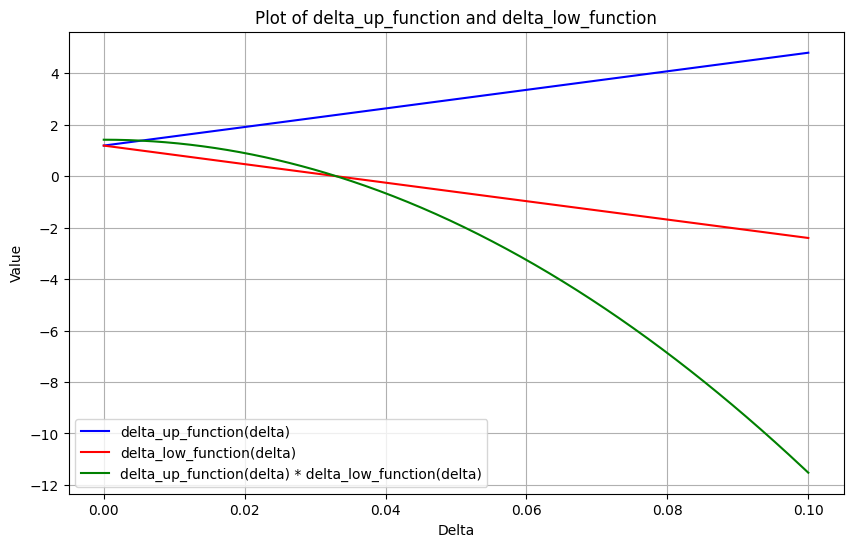

In [305]:
# x_final, delta_up,delta_low=compute_bounds(model, x_test[:1].flatten(), delta, tf.nn.relu)
# print(delta_up,delta_low)

def delta_up_function(delta):
    _,delta_up,_=compute_bounds(model, x_test[2:3].flatten(), delta,tf.nn.relu)
    return delta_up

def delta_low_function(delta):
    _,_,delta_low=compute_bounds(model, x_test[2:3].flatten(), delta,tf.nn.relu)
    return delta_low

def product(delta):
    delta_up=delta_up_function(delta)
    delta_low=delta_low_function(delta)
    return delta_up*delta_low



# Define a range of delta values
delta_values = np.linspace(0, 0.1, 400)  # Adjust the range and number of points as needed

# Compute the values of delta_up and delta_low for each delta
delta_up_values = np.array([delta_up_function(d) for d in delta_values])
delta_low_values = np.array([delta_low_function(d) for d in delta_values])  
product_values = np.array([product(d) for d in delta_values])

# Plot the functions
plt.figure(figsize=(10, 6))
plt.plot(delta_values, delta_up_values, label='delta_up_function(delta)', color='blue')
plt.plot(delta_values, delta_low_values, label='delta_low_function(delta)', color='red')
plt.plot(delta_values, product_values, label='delta_up_function(delta) * delta_low_function(delta)', color='green')
plt.xlabel('Delta')
plt.ylabel('Value')
plt.title('Plot of delta_up_function and delta_low_function')
plt.legend()
plt.grid(True)
plt.show()

layer_counter 1
(784, 512) (1, 784)
layer_counter 2
(512, 64) (1, 512)
tf.Tensor([[-0.17030895]], shape=(1, 1), dtype=float32) tf.Tensor([[-1.6910943]], shape=(1, 1), dtype=float32)


In [254]:
print(x_final)
print(delta_up)
print(delta_low)

tf.Tensor([[-0.9303235]], shape=(1, 1), dtype=float32)
tf.Tensor([[2.8661275]], shape=(1, 1), dtype=float32)
tf.Tensor([[-4.8474717]], shape=(1, 1), dtype=float32)


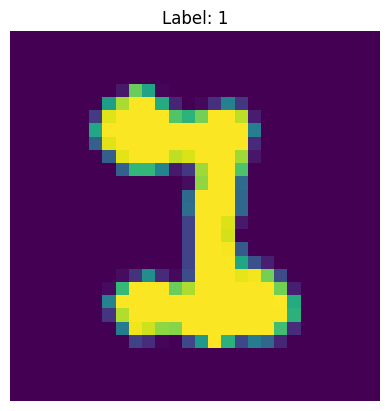

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


array([-1])

In [91]:
def positive_negative_parts(A):

    A_abs = tf.abs(A)

    A_positive = 0.5 * (A + A_abs)

    A_negative = 0.5 * (A_abs - A)

    return A_positive, A_negative


In [210]:

model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(1, activation='relu')
])

print(len(model.layers))

# for layer in model.layers:
x = np.array([[1.0, 2.0],[1.2,2.3]], dtype=np.float32)
y=model(x)
layer_counter=0
for layer in model.layers:
    if isinstance(layer, tf.keras.layers.Dense):
        print(layer.kernel.shape)
        layer_counter+=1
    else:
        layer_counter+=1
        print('layer_counter',layer_counter)



5
layer_counter 1
(2, 10)
(10, 256)
(256, 128)
(128, 1)


In [247]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, ReLU

def compute_bounds(model, x, delta,activation):
    """
    Compute Φ(x), z_delta,max and z_delta,min for a given neural network.
    
    :param model: TensorFlow Keras model.
    :param x: Input tensor (NumPy array or TensorFlow tensor).
    :param delta: Neighborhood size.
    :return: Tuple (x_L+1, x_L+1 + delta_up, x_L+1 - delta_low)
    """
    x = tf.convert_to_tensor(x, dtype=tf.float32)
    x= np.expand_dims(x, axis=0)
    
    delta = tf.convert_to_tensor(delta, dtype=tf.float32)
    
    # Initialize
    x_curr = x
   


    delta_up = delta * tf.ones_like(x)
    delta_low = delta * tf.ones_like(x)
    layer_counter=0
    # Propagate through each layer
    for layer in model.layers:
        print(f"Layer Name: {layer.name}, Layer Type: {type(layer).__name__}")
        if isinstance(layer, tf.keras.layers.Dense):
            
            if layer_counter<len(model.layers)-1:
                print('layer_counter',layer_counter)
               
                print(x_curr.shape,layer.kernel.shape)
                W = layer.kernel
                b = layer.bias
                
                
                
                W_positive, W_negative = positive_negative_parts(W)
                x_next = activation(tf.matmul(x_curr,W) + b)
                
                delta_up_new=activation(tf.matmul(x_curr,W)+tf.matmul(delta_up,W_positive)+tf.matmul(delta_low,W_negative)+b)-x_next
                delta_low_new=-activation(tf.matmul(x_curr,W)-tf.matmul(delta_low,W_positive)-tf.matmul(delta_up,W_negative)+b)+x_next

                x_curr=x_next
                delta_up=delta_up_new
                delta_low=delta_low_new

                layer_counter+=1
            
            else:
                W = layer.kernel
                b = layer.bias
                W_positive, W_negative = positive_negative_parts(W)

                x_final = tf.matmul(x_curr,W) + b
               
                delta_up_new = tf.matmul(delta_up,W_positive)+tf.matmul(delta_low,W_negative)
                delta_low_new=tf.matmul(delta_low,W_positive)+tf.matmul(delta_up,W_negative)
                
                delta_up=delta_up_new
                delta_low=delta_low_new


        else: 
            layer_counter+=1

    return x_final, x_final + delta_up, x_final - delta_low           




model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(1, activation='relu')
])



# Example input and delta
x = np.array([[1.0, 2.0]], dtype=np.float32)
print(x.shape)
u=x.flatten()
print(u.shape)
print(np.expand_dims(u, axis=0).shape)


y=model(x)



delta = 0.1
activation = tf.keras.activations.relu
# Compute bounds
x_L_plus_1, x_L_plus_1_plus_delta_up, x_L_plus_1_minus_delta_low = compute_bounds(model,x.flatten(), delta,activation)

print(f"x_L+1: {x_L_plus_1.numpy()}")
print(f"x_L+1 + delta_up: {x_L_plus_1_plus_delta_up.numpy()}")
print(f"x_L+1 - delta_low: {x_L_plus_1_minus_delta_low.numpy()}")

(1, 2)
(2,)
(1, 2)
Layer Name: dense_378, Layer Type: Dense
layer_counter 0
(1, 2) (2, 10)
Layer Name: dense_379, Layer Type: Dense
layer_counter 1
(1, 10) (10, 256)
Layer Name: dense_380, Layer Type: Dense
layer_counter 2
(1, 256) (256, 128)
Layer Name: dense_381, Layer Type: Dense
x_L+1: [[-0.04005302]]
x_L+1 + delta_up: [[1.6478956]]
x_L+1 - delta_low: [[-1.6896098]]


In [40]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Lambda
import numpy as np

input_dim = 10  # Example input dimension, adjust based on your data



Epoch 1/10


c:\Users\Gemeinschafts-PC\Desktop\Jonas\Masterarbeit\Implementation\env\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.0030 - loss: 1.0466       
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 676us/step - accuracy: 9.0301e-04 - loss: 1.0074
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 676us/step - accuracy: 8.4448e-04 - loss: 1.0328
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step - accuracy: 0.0000e+00 - loss: 1.0139
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 676us/step - accuracy: 0.0000e+00 - loss: 1.0155
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 643us/step - accuracy: 0.0000e+00 - loss: 0.9948
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step - accuracy: 0.0000e+00 - loss: 1.0067
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step - accuracy: 0.0000e+00 - loss: 1.0068
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 644us/step - accuracy: 0.0000e+00 - loss: 0.9976
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 676us/step - accuracy: 0.0000e+00 - loss: 0.9949


Number of layers: 3


c:\Users\Gemeinschafts-PC\Desktop\Jonas\Masterarbeit\Implementation\env\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [53]:
import tensorflow as tf
import numpy as np

def compute_bounds(model, x, delta):
    """
    Compute Φ(x), z_delta,max, and z_delta,min for a given neural network.
    
    :param model: TensorFlow Keras model.
    :param x: Input tensor (NumPy array or TensorFlow tensor).
    :param delta: Neighborhood size.
    :return: Tuple (x_L+1, x_L+1 + delta_up, x_L+1 - delta_low)
    """
    x = tf.convert_to_tensor(x, dtype=tf.float32)
    delta = tf.convert_to_tensor(delta, dtype=tf.float32)

    # Initialize
    x_curr = x
    delta_up = delta * tf.ones_like(x)
    delta_low = delta * tf.ones_like(x)

    # Define activation functions
    def relu(x):
        return tf.nn.relu(x)
    
    def tanh(x):
        return tf.nn.tanh(x)
    
    def sigmoid(x):
        return tf.nn.sigmoid(x)

    # Propagate through each layer
    for layer in model.layers:
        if isinstance(layer, tf.keras.layers.Dense):
            W = layer.kernel
            b = layer.bias
            
            # Compute the bounds
            x_next = tf.matmul(x_curr, W) + b

            # Handle activation functions
            if layer.activation == relu:
                x_next_up = relu(x_next + delta_up)
                x_next_low = relu(x_next - delta_low)
            elif layer.activation == tanh:
                x_next_up = tanh(x_next + delta_up)
                x_next_low = tanh(x_next - delta_low)
            elif layer.activation == sigmoid:
                x_next_up = sigmoid(x_next + delta_up)
                x_next_low = sigmoid(x_next - delta_low)
            else:
                raise NotImplementedError("Activation function not implemented")
            
            # Update the perturbation bounds
            delta_up = tf.reduce_max(tf.abs(tf.matmul(delta_up, W)), axis=0) + delta_up
            delta_low = tf.reduce_max(tf.abs(tf.matmul(delta_low, W)), axis=0) + delta_low
            
            x_curr = x_next

    # Final output layer
    if isinstance(layer, tf.keras.layers.Dense):
        W = layer.kernel
        b = layer.bias
        x_final = tf.matmul(x_curr, W) + b
        
        delta_up = tf.reduce_max(tf.abs(W), axis=0) * delta_up
        delta_low = tf.reduce_max(tf.abs(W), axis=0) * delta_low

    return x_final, x_final + delta_up, x_final - delta_low

# Example usage
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, ReLU

# Define the model
model = Sequential([
    Dense(3, input_shape=(2,), activation='relu'),
    Dense(1)
])

# Example input and delta
x = np.array([[1.0, 2.0]], dtype=np.float32)
delta = 0.1

# Compute bounds
x_L_plus_1, x_L_plus_1_plus_delta_up, x_L_plus_1_minus_delta_low = compute_bounds(model, x, delta)

print(f"x_L+1: {x_L_plus_1.numpy()}")
print(f"x_L+1 + delta_up: {x_L_plus_1_plus_delta_up.numpy()}")
print(f"x_L+1 - delta_low: {x_L_plus_1_minus_delta_low.numpy()}")

NotImplementedError: Activation function not implemented